Three dependent variables, `left`, `personal_left` and `satisfaction_level` <BR/>
This Jupyter notebook built models to predict `personal_left`
* Random Forest Model
* XGBoost Model

### Import packages

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import PredefinedSplit
from sklearn.ensemble import RandomForestClassifier

from xgboost import XGBClassifier
from xgboost import plot_importance
from xgboost import plot_tree

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score, make_scorer, fbeta_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score

import pickle
import math

import statsmodels.api as sm
from scipy import stats
from sklearn import preprocessing


#test
from scipy.stats import kruskal, friedmanchisquare
from scipy.stats import ks_2samp
from scipy.stats import levene
from scipy.stats import mannwhitneyu
from statsmodels.stats.proportion import proportions_ztest

# Import the necessary libraries
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import KFold


In [2]:
pd.set_option('display.max_columns', None)

input_file_path='/kaggle/input/salifort-motors-employee-leave-prediction-eda/'

import warnings
warnings.filterwarnings('ignore')

### Load dataset

In [3]:
# Load dataset into a dataframe
# data after cleaning
df_drop = pd.read_csv(input_file_path+"employee_data_clean.csv")

# Display first few rows of the dataframe
df_drop.head(10)

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,left,promotion_last_5years,department,salary,salary_encoding,emp_type,evaluation_range,average_monthly_hours_range,time_spend_company_range,left_group,left_type,personal_left
0,0.38,0.53,2,157,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0
1,0.80,0.86,5,262,6,0,1,0,sales,medium,1,full time,"(0.8,1]","(240,280]",>=6,group3,company,0
2,0.11,0.88,7,272,4,0,1,0,sales,medium,1,full time,"(0.8,1]","(240,280]",4,group2,company,0
3,0.72,0.87,5,223,5,0,1,0,sales,low,0,full time,"(0.8,1]","(200,240]",5,group3,company,0
4,0.37,0.52,2,159,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0
5,0.41,0.50,2,153,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0
6,0.10,0.77,6,247,4,0,1,0,sales,low,0,full time,"(0.6,0.8]","(240,280]",4,group2,company,0
7,0.92,0.85,5,259,5,0,1,0,sales,low,0,full time,"(0.8,1]","(240,280]",5,group3,company,0
8,0.89,1.00,5,224,5,0,1,0,sales,low,0,full time,"(0.8,1]","(200,240]",5,group3,company,0
9,0.42,0.53,2,142,3,0,1,0,sales,low,0,part time,"(0.4,0.6]","(125,160]",3,group1,company,0


In [4]:
df_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   satisfaction_level           11991 non-null  float64
 1   last_evaluation              11991 non-null  float64
 2   number_project               11991 non-null  int64  
 3   average_monthly_hours        11991 non-null  int64  
 4   time_spend_company           11991 non-null  int64  
 5   work_accident                11991 non-null  int64  
 6   left                         11991 non-null  int64  
 7   promotion_last_5years        11991 non-null  int64  
 8   department                   11991 non-null  object 
 9   salary                       11991 non-null  object 
 10  salary_encoding              11991 non-null  int64  
 11  emp_type                     11991 non-null  object 
 12  evaluation_range             11991 non-null  object 
 13  average_monthly_

### Encode Data

In [5]:
###########################################
#Encode salary
###########################################
# Create categorical designations
salary_order = ['low', 'medium', 'high']
# Encode `df_drop` column as categoricals 
df_drop['salary'] = pd.Categorical(df_drop['salary'], categories=salary_order, ordered=True)

###########################################
#Encode average_monthly_hours_range
###########################################
# Create categorical designations
average_monthly_hours_range_order = ['[0,125]', '(125,160]', '(160,200]', '(200,240]', '(240,280]','(280,inf)']
# Encode `average_monthly_hours_range` column as categoricals 
df_drop['average_monthly_hours_range'] = pd.Categorical(df_drop['average_monthly_hours_range'], categories=average_monthly_hours_range_order, ordered=True)


###########################################
#Encode evaluation_range
###########################################
# Create categorical designations
evaluation_range_order = ['[0,0.2]', '(0.2,0.4]', '(0.4,0.6]', '(0.6,0.8]', '(0.8,1]']
# Encode `evaluation_range` column as categoricals 
df_drop['evaluation_range'] = pd.Categorical(df_drop['evaluation_range'], categories=evaluation_range_order, ordered=True)

###########################################
#Encode time_spend_company_range
###########################################
# Create categorical designations
time_spend_company_range_order = ['<2', '2', '3', '4', '5','>=6']
# Encode `average_monthly_hours_range` column as categoricals 
df_drop['time_spend_company_range'] = pd.Categorical(df_drop['time_spend_company_range'], categories=time_spend_company_range_order, ordered=True)


## Data Exploration

Please refer `salifort-motors-employee-leave-prediction-eda` lab for EDA<BR/>
This lab mainly confirm `personal_left`

In [6]:
#format of pie plot
def autopct_format(values):
        def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return my_format

def show_test_result(statistic, p_value,significance_level):    
    if p_value <= significance_level:
        print(f'Reject H0 at significance level {significance_level} (Pvalue={round(p_value,3)}, Statistic={round(statistic,2)})')
    else:
        print(f'Fail to reject H0 at significance level {significance_level} (Pvalue={round(p_value,3)}, Statistic={round(statistic,2)})')

def draw_bs_sample(data):
    """Draw a bootstrap sample from a 1D data set."""
    return np.random.choice(data, size=len(data), replace=True)

def percentile_bootstrap_ci(
    data,
    statfunction=np.mean,
    resample_count=10000,
    convidence_level=0.95,
):
    '''return convidenve interval for given data'''
    test_statistic_list=np.empty(resample_count)
    for i in range(resample_count):
        #draw a bootstrap sample from original sample
        sample = draw_bs_sample(data)
        #recompute the statistic on outter bootstrap samples
        test_statistic = statfunction(sample)
        test_statistic_list[i]=test_statistic
    alphas = np.array([(1-convidence_level)/2., 1-(1-convidence_level)/2.])
    lower,upper=np.quantile(test_statistic_list,alphas)
    return (lower,upper,test_statistic_list)

#### Confirm personal_left

##### personal_left vs number_project

number_project,personal_left,2,3,4,5,6,7
0,0,1554,3482,3640,2197,792,135
1,1,28,38,45,36,34,10


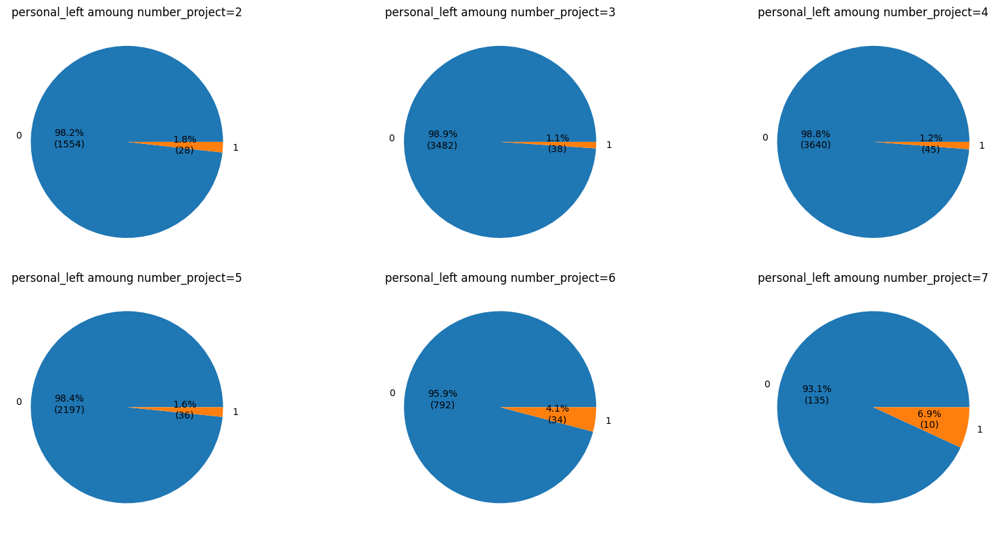

In [7]:
#######################################
#P(personal_left | number_project)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['number_project'],margins=False).reset_index()

display(result)
col_nm=df_drop['number_project'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=3
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung number_project={col}")
plt.tight_layout()
plt.show()

In [8]:
#$H_{0}$: No association between number_project and personal_left
#$H_{A}$: There is an association between number_project and personal_left
result=pd.crosstab(df_drop['number_project'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
number_project,,
2,1554,28
3,3482,38
4,3640,45
5,2197,36
6,792,34
7,135,10


Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=69.06)


##### personal_left vs time_spend_company

time_spend_company,personal_left,2,3,4,5,6,7,8,10
0,0,2879,5145,1951,1012,531,94,81,107
1,1,31,45,54,50,11,0,0,0


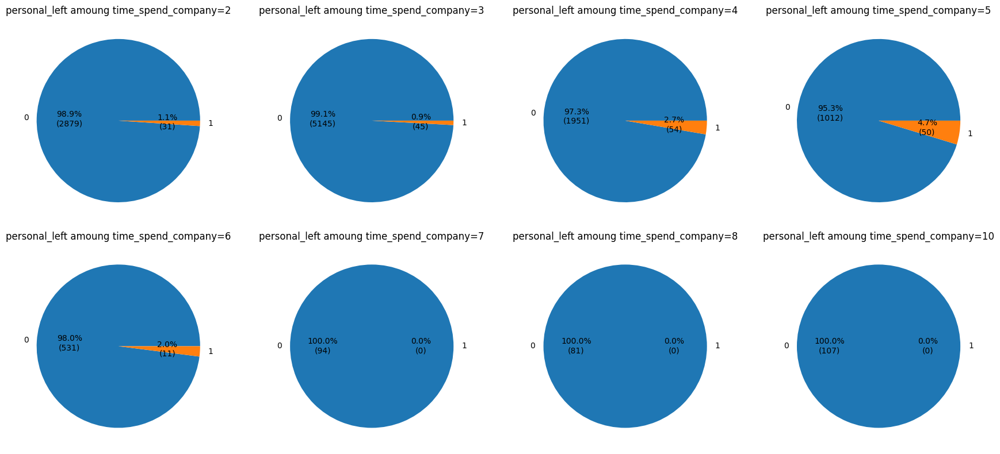

In [9]:
#######################################
#P(personal_left | time_spend_company)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['time_spend_company'],margins=False).reset_index()

display(result)
col_nm=df_drop['time_spend_company'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=4
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung time_spend_company={col}")
plt.tight_layout()
plt.show()

##### personal_left vs work_accident

work_accident,personal_left,0,1
0,0,9962,1838
1,1,179,12


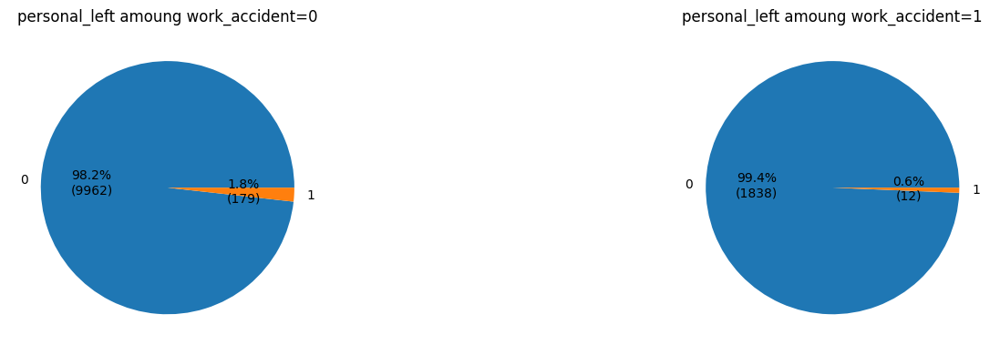

In [10]:
#######################################
#P(personal_left | work_accident)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['work_accident'],margins=False).reset_index()

display(result)
col_nm=df_drop['work_accident'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=2
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung work_accident={col}")
plt.tight_layout()
plt.show()


In [11]:
#$H_{0}$: No association between work_accident and personal_left
#$H_{A}$: There is an association between work_accident and personal_left
result=pd.crosstab(df_drop['work_accident'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
work_accident,,
0,9962,179
1,1838,12


Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=12.44)


##### personal_left vs promotion_last_5years

promotion_last_5years,personal_left,0,1
0,0,11598,202
1,1,190,1


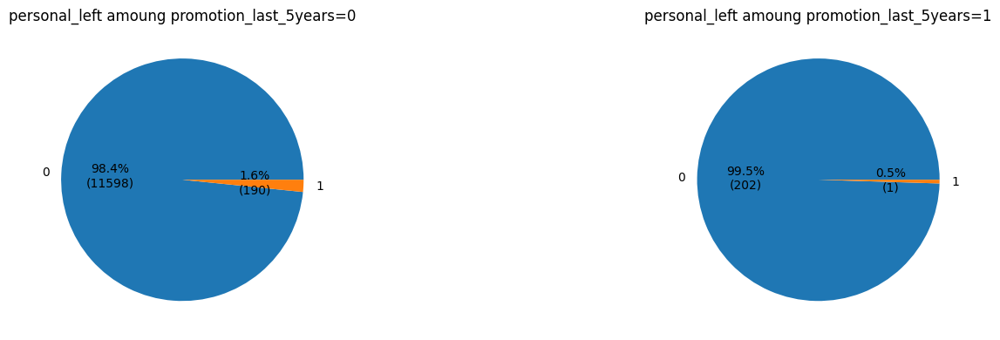

In [12]:
#######################################
#P(personal_left | promotion_last_5years)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['promotion_last_5years'],margins=False).reset_index()

display(result)
col_nm=df_drop['promotion_last_5years'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=2
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung promotion_last_5years={col}")
plt.tight_layout()
plt.show()


In [13]:
#$H_{0}$: No association between promotion_last_5years and personal_left
#$H_{A}$: There is an association between promotion_last_5years and personal_left
result=pd.crosstab(df_drop['promotion_last_5years'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
promotion_last_5years,,
0,11598,190
1,202,1


Fail to reject H0 at significance level 0.01 (Pvalue=0.207, Statistic=1.59)


##### personal_left vs department

department,personal_left,IT,RandD,accounting,hr,management,marketing,product_mng,sales,support,technical
0,0,965,683,610,589,429,665,678,3191,1790,2200
1,1,11,11,11,12,7,8,8,48,31,44


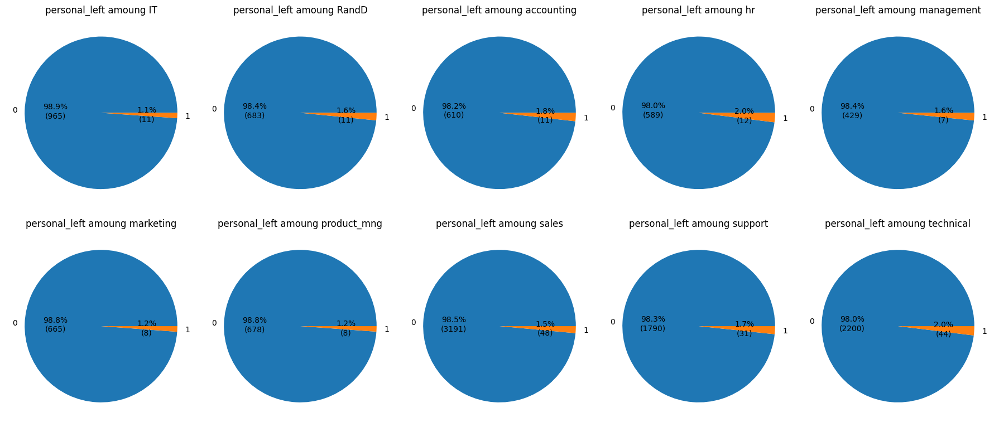

In [14]:
#######################################
#P(personal_left | department)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['department'],margins=False).reset_index()

display(result)
col_nm=df_drop['department'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=5
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung {col}")
plt.tight_layout()
plt.show()

In [15]:
#$H_{0}$: No association between department and personal_left
#$H_{A}$: There is an association between department and personal_left
result=pd.crosstab(df_drop['department'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
department,,
IT,965,11
RandD,683,11
accounting,610,11
hr,589,12
management,429,7
marketing,665,8
product_mng,678,8
sales,3191,48
support,1790,31


Fail to reject H0 at significance level 0.01 (Pvalue=0.747, Statistic=5.93)


personal_left,department,0,1
0,IT,965,11
1,RandD,683,11
2,accounting,610,11
3,hr,589,12
4,management,429,7
5,marketing,665,8
6,product_mng,678,8
7,sales,3191,48
8,support,1790,31
9,technical,2200,44


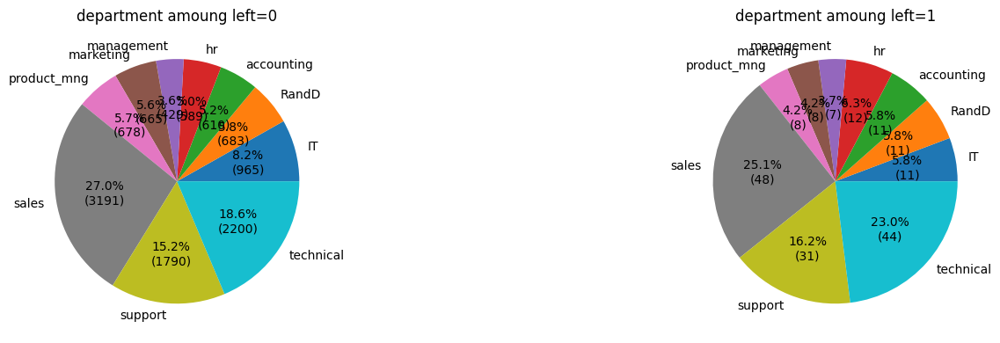

In [16]:
#######################################
#P(department | personal_left)
#######################################
result=pd.crosstab(df_drop['department'],df_drop['personal_left'],margins=False).reset_index()

display(result)
col_nm=df_drop['personal_left'].unique().tolist()
col_nm.sort()

#######################################
#Pie Chart
#######################################
colCnt=2
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["department"], autopct=autopct_format(result[col]))
    ax.set_title(f"department amoung left={col}")
plt.tight_layout()
plt.show()

##### personal_left vs salary

salary,personal_left,low,medium,high
0,0,5624,5191,985
1,1,116,70,5


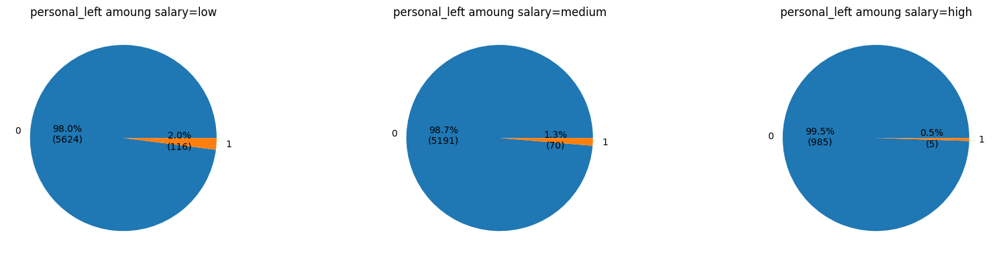

In [17]:
#######################################
#P(personal_left | salary)
#######################################
result=pd.crosstab(df_drop['personal_left'],df_drop['salary'],margins=False).reset_index()

display(result)
col_nm=df_drop['salary'].unique().tolist()

#######################################
#Pie Chart
#######################################
colCnt=3
rowCnt=math.ceil(len(col_nm)/colCnt)

fig, axs = plt.subplots(rowCnt,colCnt,figsize=(18,rowCnt*4))
for col,ax in zip(col_nm,axs.ravel()):
    ax.pie(result[col],labels = result["personal_left"], autopct=autopct_format(result[col]))
    ax.set_title(f"personal_left amoung salary={col}")
plt.tight_layout()
plt.show()

In [18]:
#$H_{0}$: No association between salary and personal_left
#$H_{A}$: There is an association between salary and personal_left
result=pd.crosstab(df_drop['salary'], df_drop['personal_left'])
display(result)

significance_level=0.01

statistic, pvalue, dof, expected_value_arr  = stats.contingency.chi2_contingency(result, correction=False)

show_test_result(statistic, pvalue,significance_level)

personal_left,0,1
salary,,
low,5624,116
medium,5191,70
high,985,5


Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=16.49)


In [19]:
#post hoc test for proportion 

#https://www.statsmodels.org/dev/generated/statsmodels.stats.proportion.proportions_ztest.html
#$H_{0}$: promoted proportion of two compared salary were identical
#$H_{A}$: promoted proportion of two compared salary were not identical
significance_level=0.01

print('proportions_ztest test result of personal_left')
results = {}
cal_result=pd.crosstab(df_drop['salary'], df_drop['personal_left']).reset_index()
cal_result['All']=cal_result[0]+cal_result[1]
display(cal_result)

for i, item1 in enumerate(sorted(cal_result['salary'].unique().tolist())):
    for j, item2 in enumerate(sorted(cal_result['salary'].unique().tolist())):
        if i < j:
            
            statistic, pvalue = proportions_ztest(cal_result[cal_result['salary'].isin([item1,item2])][1],
                                                 cal_result[cal_result['salary'].isin([item1,item2])]['All'])
            if pvalue<=significance_level:
                result='Reject H0'
            else:
                result='Fail reject'
            results[f"{item1} vs {item2}"] = (statistic, pvalue ,result)

# Convert the results into a DataFrame
result_df = pd.DataFrame(results).transpose()
result_df.columns = ['Statistic', 'Pvalue','Result']
result_df.reset_index(inplace=True)
result_df.rename(columns={'index': 'salary_compared'}, inplace=True)

result_df
#=>low salary different from medium and high

proportions_ztest test result of personal_left


personal_left,salary,0,1,All
0,low,5624,116,5740
1,medium,5191,70,5261
2,high,985,5,990


,salary_compared,Statistic,Pvalue,Result
0,high vs low,3.31496,0.000917,Reject H0
1,high vs medium,2.188551,0.028629,Fail reject
2,low vs medium,2.805513,0.005024,Reject H0


##### personal_left vs satisfaction_level

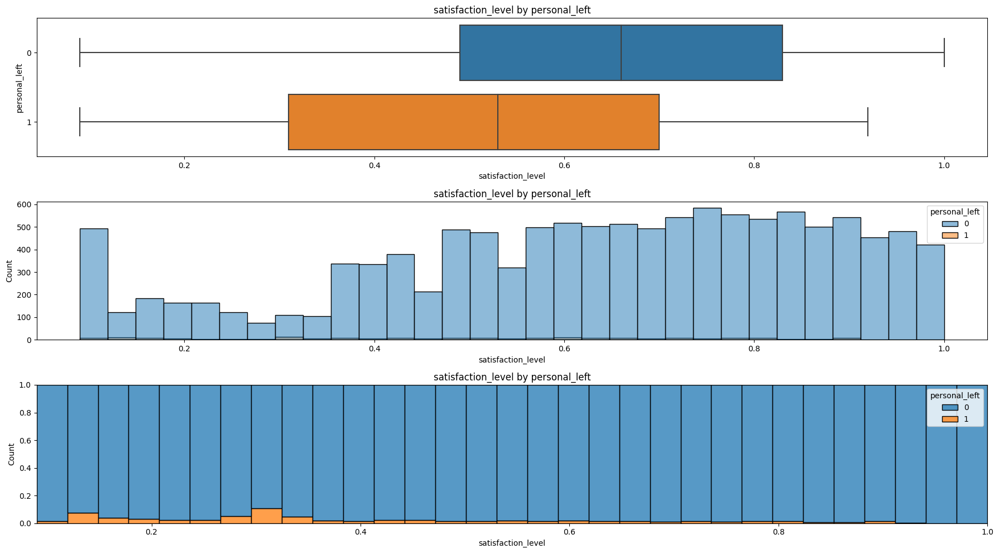

,personal_left,min,max,std,mean,median,count
0,0,0.09,1.00,0.240606,0.631703,0.66,11800
1,1,0.09,0.92,0.236655,0.503351,0.53,191


In [20]:
#############################################
#satisfaction_level and personal_left
#############################################
fig, axs = plt.subplots(3,1,figsize=(18,10))

sns.boxplot(data=df_drop,y=df_drop['personal_left'].astype(str),x='satisfaction_level',ax=axs[0])
axs[0].set_title('satisfaction_level by personal_left')

sns.histplot(data=df_drop,hue=df_drop['personal_left'].astype(str),x='satisfaction_level',palette='tab10',ax=axs[1])
axs[1].set_title('satisfaction_level by personal_left')

sns.histplot(data=df_drop,hue=df_drop['personal_left'].astype(str),x='satisfaction_level',palette='tab10',multiple='fill',ax=axs[2])
axs[2].set_title('satisfaction_level by personal_left')


plt.tight_layout()
plt.show()

display(df_drop.groupby(['personal_left'])['satisfaction_level'].agg(['min','max','std','mean','median','count']).reset_index())


In [21]:
# Levene test for equal variances.
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.levene.html
#H0:All input samples are from populations with equal variances
#HA:At least one input sample are from populations with different variance
significance_level=0.01
print('Levene test result of satisfaction_level')
statistic, p_value = levene(*[df_drop['satisfaction_level'][df_drop['personal_left'] == item]
                                    for item in df_drop['personal_left'].unique()])
show_test_result(statistic, p_value,significance_level)

Levene test result of satisfaction_level
Fail to reject H0 at significance level 0.01 (Pvalue=0.582, Statistic=0.3)


In [22]:
# Kruskal-Wallis test
#H0:The population median of all of the groups are equal
#HA:At least one group has different median
significance_level=0.01
print('Kruskal-Wallis test result of satisfaction_level')
statistic, p_value = kruskal(*[df_drop['satisfaction_level'][df_drop['personal_left'] == item]
                                    for item in df_drop['personal_left'].unique()])
show_test_result(statistic, p_value,significance_level)

Kruskal-Wallis test result of satisfaction_level
Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=51.58)


In [23]:
# Mann-Whitney U rank test
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.mannwhitneyu.html
#H0:The population median of left employee great equal than employee who didn't leave
#HA:The population median of left employee less than employee who didn't leave
significance_level=0.01
print('Mann-Whitney test result of satisfaction_level')
statistic, p_value = mannwhitneyu(df_drop[df_drop['personal_left']==1]['satisfaction_level'], 
                                  df_drop[df_drop['personal_left']==0]['satisfaction_level'],
                                  alternative="less")
show_test_result(statistic, p_value,significance_level)

Mann-Whitney test result of satisfaction_level
Reject H0 at significance level 0.01 (Pvalue=0.0, Statistic=786089.5)


##### personal_left vs last_evaluation

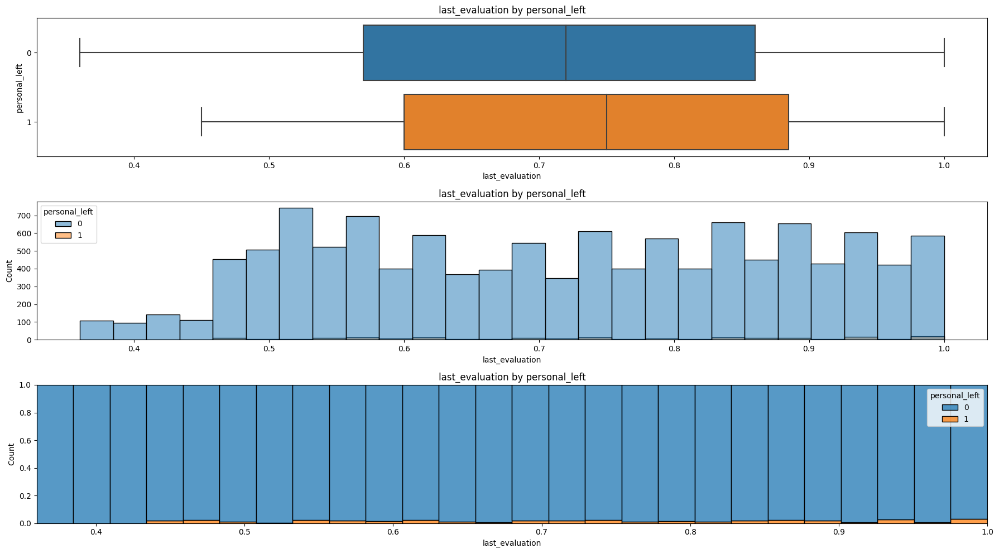

,personal_left,min,max,std,mean,median,count
0,0,0.36,1.0,0.168335,0.716234,0.72,11800
1,1,0.45,1.0,0.166943,0.744398,0.75,191


In [24]:
#############################################
#last_evaluation and left
#############################################
fig, axs = plt.subplots(3,1,figsize=(18,10))

sns.boxplot(data=df_drop,y=df_drop['personal_left'].astype(str),x='last_evaluation',ax=axs[0])
axs[0].set_title('last_evaluation by personal_left')

sns.histplot(data=df_drop,hue='personal_left',x='last_evaluation',palette='tab10',ax=axs[1])
axs[1].set_title('last_evaluation by personal_left')

sns.histplot(data=df_drop,hue='personal_left',x='last_evaluation',palette='tab10',multiple='fill',ax=axs[2])
axs[2].set_title('last_evaluation by personal_left')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['personal_left'])['last_evaluation'].agg(['min','max','std','mean','median','count']).reset_index())

#####  personal_left vs average_monthly_hours

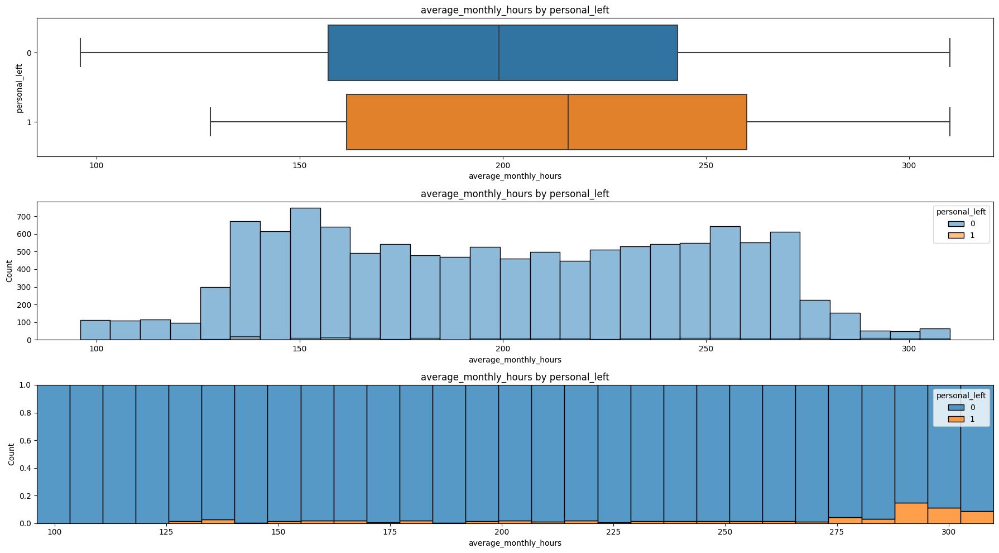

,personal_left,min,max,std,mean,median,count
0,0,96,310,48.595433,200.252034,199.0,11800
1,1,128,310,54.733002,214.157068,216.0,191


In [25]:
#############################################
#average_monthly_hours and personal_left
#############################################
fig, axs = plt.subplots(3,1,figsize=(18,10))

sns.boxplot(data=df_drop,y=df_drop['personal_left'].astype(str),x='average_monthly_hours',ax=axs[0])
axs[0].set_title('average_monthly_hours by personal_left')

sns.histplot(data=df_drop,hue='personal_left',x='average_monthly_hours',palette='tab10',ax=axs[1])
axs[1].set_title('average_monthly_hours by personal_left')

sns.histplot(data=df_drop,hue='personal_left',x='average_monthly_hours',palette='tab10',multiple='fill',ax=axs[2])
axs[2].set_title('average_monthly_hours by personal_left')

plt.tight_layout()
plt.show()

display(df_drop.groupby(['personal_left'])['average_monthly_hours'].agg(['min','max','std','mean','median','count']).reset_index())


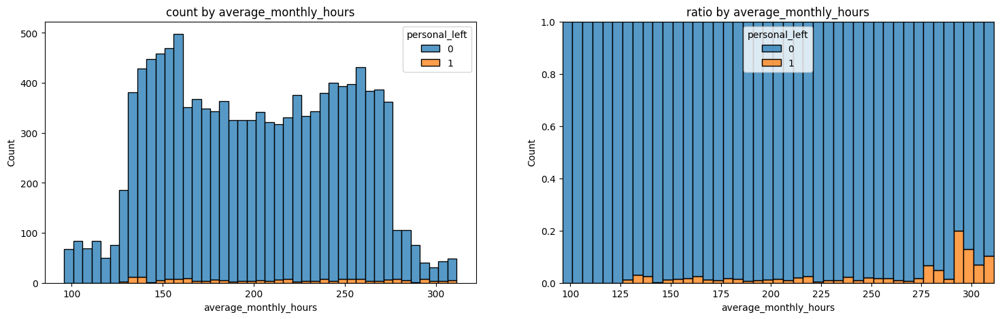

In [26]:
#############################################
#Histplot of average_monthly_hours
#############################################
fig, axs = plt.subplots(1,2,figsize=(18,5))
sns.histplot(data=df_drop,hue='personal_left',x='average_monthly_hours',palette='tab10',multiple='stack',binwidth=5,ax=axs[0])
axs[0].set_title('count by average_monthly_hours')
sns.histplot(data=df_drop,hue='personal_left',x='average_monthly_hours',palette='tab10',multiple='fill',binwidth=5,ax=axs[1])
axs[1].set_title('ratio by average_monthly_hours')
plt.show()

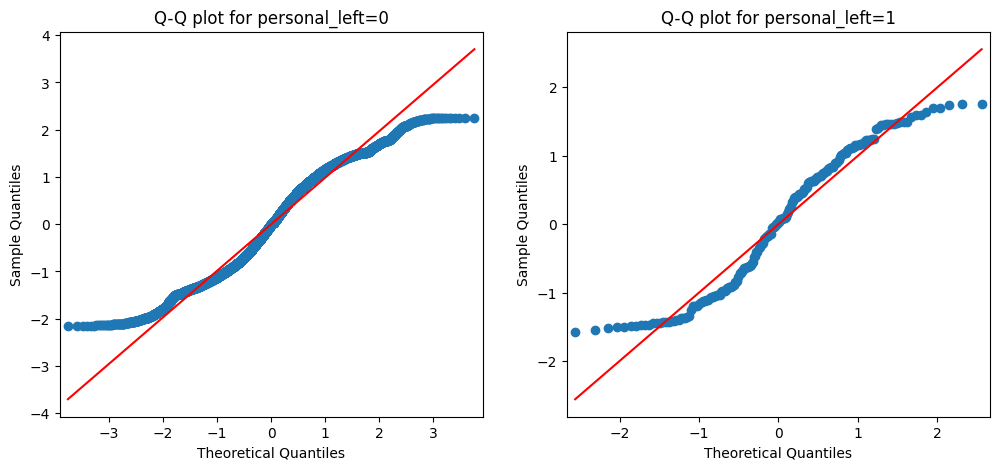

In [27]:
####################################################
#Q-Q plot
####################################################
from scipy.stats import norm
fig, axs = plt.subplots(1,2,figsize=(12,5))

qq = sm.qqplot(df_drop[df_drop['personal_left']==0]['average_monthly_hours'], norm,fit=True,line="r",ax=axs[0])
axs[0].set_title(f"Q-Q plot for personal_left=0")
qq = sm.qqplot(df_drop[df_drop['personal_left']==1]['average_monthly_hours'], norm,fit=True,line="r",ax=axs[1])
axs[1].set_title(f"Q-Q plot for personal_left=1")

plt.show()

In [28]:
from scipy.stats import bootstrap

data1 = (df_drop[df_drop['personal_left']==0]['average_monthly_hours'],) 
res1 = bootstrap(data1, np.mean, confidence_level=0.95,alternative='two-sided', method='BCa',random_state=7)
print(res1.confidence_interval)

data2 = (df_drop[df_drop['personal_left']==1]['average_monthly_hours'],) 
res2 = bootstrap(data2, np.mean, confidence_level=0.95,alternative='two-sided', method='BCa',random_state=7)
print(res2.confidence_interval)

ConfidenceInterval(low=199.37637492290176, high=201.10355025351285)
ConfidenceInterval(low=206.18501593642262, high=221.88356779962004)


In [29]:
percentile_bootstrap_ci(df_drop[df_drop['personal_left']==0]['average_monthly_hours'],np.median)

(198.0, 201.0, array([200. , 197. , 200. , ..., 196.5, 200. , 200. ]))

## Build models


### Modeling

In [30]:
target_columns=[
       'satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident', 'left',
       'promotion_last_5years', 'department', 'salary','emp_type','personal_left'
               ]
df_sample=df_drop[target_columns]

In [31]:
#confirm proportion of left employees
display(df_sample['left'].value_counts(normalize=True))

left
0    0.833959
1    0.166041
Name: proportion, dtype: float64

In [32]:
#confirm proportion of personal_left employees
display(df_sample['personal_left'].value_counts(normalize=True))

#=>very imbalanced dataset

personal_left
0    0.984071
1    0.015929
Name: proportion, dtype: float64

In [33]:
######################################################
#Dummy encoding
######################################################
df_dummy=df_sample.copy()

#confirm after update
df_dummy.info()

#**************************#
#Confirm column names
#**************************#
#check object type and see if any object columns+'_' exists in other columns(e.g. RatecodeID and RatecodeID_XXXX NG)
#get columns which could be convert into dummy/indicator variables
trans_dummy_variables=list(df_dummy.select_dtypes(include=[object,'category']).columns)

#get columns which could not be convert into dummy/indicator variables
not_trans_dummy_variables=list(df_dummy.select_dtypes(exclude=[object,'category']).columns)

#after dummy encoding, their column name would be XXXX->XXXX_YYYY1,XXXX_YYYY2....
#get_fit_features will not work correctly if both XXXX and XXXX_?(Not columns after dummy encoding)(? means any word) exist
if len(trans_dummy_variables)+len(not_trans_dummy_variables)!=len(df_dummy.columns):
    raise Exception("Data type incorrect, please check again")
if not (set(trans_dummy_variables).union(set(not_trans_dummy_variables))==set(df_dummy.columns)):
    raise Exception("Data type incorrect, please check again")
print(trans_dummy_variables)
dummy_prefix_sep='_dummy_'
duplicate_flg=False

for dummy_col in trans_dummy_variables:
    for not_trans_col in not_trans_dummy_variables:
        if (dummy_col+dummy_prefix_sep) in not_trans_col:
            duplicate_flg=True
if duplicate_flg==True:
    raise Exception("Dummy variable columns duplicated with others, please update column names")


# Convert categoricals to binary
df_dummy=pd.get_dummies(df_dummy,columns=['department', 'salary','emp_type'], prefix_sep=dummy_prefix_sep, dtype=bool, prefix=None)
df_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   satisfaction_level     11991 non-null  float64 
 1   last_evaluation        11991 non-null  float64 
 2   number_project         11991 non-null  int64   
 3   average_monthly_hours  11991 non-null  int64   
 4   time_spend_company     11991 non-null  int64   
 5   work_accident          11991 non-null  int64   
 6   left                   11991 non-null  int64   
 7   promotion_last_5years  11991 non-null  int64   
 8   department             11991 non-null  object  
 9   salary                 11991 non-null  category
 10  emp_type               11991 non-null  object  
 11  personal_left          11991 non-null  int64   
dtypes: category(1), float64(2), int64(7), object(2)
memory usage: 1.0+ MB
['department', 'salary', 'emp_type']
<class 'pandas.core.frame.DataFrame'>

In [34]:
######################################################
#Label encoding
######################################################
df_label=df_sample.copy()

#confirm after update
df_label.info()

df_label['salary']=df_label['salary'].cat.codes

#encode department
label_encoder = preprocessing.LabelEncoder()
df_label['department']= label_encoder.fit_transform(df_label['department'])

#encode emp_type
map_emp_type={
    'part time':0,
    'full time':1
}
df_label['emp_type']= df_label['emp_type'].map(map_emp_type)

#confirm after update
df_label.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   satisfaction_level     11991 non-null  float64 
 1   last_evaluation        11991 non-null  float64 
 2   number_project         11991 non-null  int64   
 3   average_monthly_hours  11991 non-null  int64   
 4   time_spend_company     11991 non-null  int64   
 5   work_accident          11991 non-null  int64   
 6   left                   11991 non-null  int64   
 7   promotion_last_5years  11991 non-null  int64   
 8   department             11991 non-null  object  
 9   salary                 11991 non-null  category
 10  emp_type               11991 non-null  object  
 11  personal_left          11991 non-null  int64   
dtypes: category(1), float64(2), int64(7), object(2)
memory usage: 1.0+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 1199

#### **Split the data**

Split data into train, validation, test sets.

In [35]:
RANDOM_STATE=0
depedent_variables=['left','personal_left']
################################################
#Use dummy encoding dataset
################################################
y_dummy_list=[]
for depedent_var in depedent_variables:
    y_dummy=df_dummy[depedent_var]
    y_dummy_list.append(y_dummy)

X_dummy = df_dummy.copy()
X_dummy = X_dummy.drop(depedent_variables, axis = 1)


#*****************************************#
# Split into train and test sets
#*****************************************#
X_dummy_train_val_list=[]
y_dummy_train_val_list=[]
X_dummy_test_list=[]
y_dummy_test_list=[]
X_dummy_train_list=[]
y_dummy_train_list=[]
X_dummy_val_list=[]
y_dummy_val_list=[]

for y_dummy in y_dummy_list:
    X_dummy_train_val, X_dummy_test, y_dummy_train_val, y_dummy_test = train_test_split(X_dummy, y_dummy, 
                                                        test_size=0.25, stratify=y_dummy, 
                                                        random_state=RANDOM_STATE)
    
    # Split train into train and validation sets
    X_dummy_train, X_dummy_val, y_dummy_train, y_dummy_val = train_test_split(X_dummy_train_val, y_dummy_train_val, 
                                                      test_size=0.2, stratify=y_dummy_train_val, 
                                                      random_state=RANDOM_STATE)
    X_dummy_train_val_list.append(X_dummy_train_val)
    y_dummy_train_val_list.append(y_dummy_train_val)
    X_dummy_test_list.append(X_dummy_test)
    y_dummy_test_list.append(y_dummy_test)
    X_dummy_train_list.append(X_dummy_train)
    y_dummy_train_list.append(y_dummy_train)
    X_dummy_val_list.append(X_dummy_val)
    y_dummy_val_list.append(y_dummy_val)

################################################
#Use Label encoding dataset
################################################
y_label_list=[]
for depedent_var in depedent_variables:
    y_label=df_label[depedent_var]
    y_label_list.append(y_label)

X_label = df_label.copy()
X_label = X_label.drop(depedent_variables, axis = 1)

#*****************************************#
# Split into train and test sets
#*****************************************#
X_label_train_val_list=[]
y_label_train_val_list=[]
X_label_test_list=[]
y_label_test_list=[]
X_label_train_list=[]
y_label_train_list=[]
X_label_val_list=[]
y_label_val_list=[]

for y_label in y_label_list:
    X_label_train_val, X_label_test, y_label_train_val, y_label_test = train_test_split(X_label, y_label, 
                                                        test_size=0.25, stratify=y_label, 
                                                        random_state=RANDOM_STATE)
    
    # Split train into train and validation sets
    X_label_train, X_label_val, y_label_train, y_label_val = train_test_split(X_label_train_val, y_label_train_val, 
                                                      test_size=0.2, stratify=y_label_train_val, 
                                                      random_state=RANDOM_STATE)
    X_label_train_val_list.append(X_label_train_val)
    y_label_train_val_list.append(y_label_train_val)
    X_label_test_list.append(X_label_test)
    y_label_test_list.append(y_label_test)
    X_label_train_list.append(X_label_train)
    y_label_train_list.append(y_label_train)
    X_label_val_list.append(X_label_val)
    y_label_val_list.append(y_label_val)

#### **Oversampling**

* [Random Oversampling and Undersampling for Imbalanced Classification](https://machinelearningmastery.com/random-oversampling-and-undersampling-for-imbalanced-classification/)
* [Balancing Imbalanced Data: Undersampling and Oversampling Techniques in Python](https://medium.com/@daniele.santiago/balancing-imbalanced-data-undersampling-and-oversampling-techniques-in-python-7c5378282290)
* [SMOTE for Imbalanced Classification with Python](https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/)
* [imblearn.over_sampling.SMOTE](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html)
* [How to do cross-validation when upsampling data](https://kiwidamien.github.io/how-to-do-cross-validation-when-upsampling-data.html)

In [36]:
# Creating an instance of SMOTE
oversample = SMOTE(sampling_strategy=0.43, random_state=7)

# Balancing the data
resample_index=depedent_variables.index('personal_left')
X_dummy_train_resampled, y_dummy_train_resampled = oversample.fit_resample(X_dummy_train_list[resample_index], y_dummy_train_list[resample_index])
X_label_train_resampled, y_label_train_resampled = oversample.fit_resample(X_label_train_list[resample_index], y_label_train_list[resample_index])

In [37]:
print('original count',y_dummy_train_list[resample_index].sum())
print('original ratio',y_dummy_train_list[resample_index].sum()/y_dummy_train_list[resample_index].shape[0])

print('dummy oversampling count',y_dummy_train_resampled.sum())
print('dummy oversampling increase',y_dummy_train_resampled.shape[0]-y_dummy_train_list[resample_index].shape[0])
print('dummy oversampling ratio',y_dummy_train_resampled.sum()/y_dummy_train_resampled.shape[0])

print('original count',y_label_train_list[resample_index].sum())
print('original ratio',y_label_train_list[resample_index].sum()/y_label_train_list[resample_index].shape[0])

print('label oversampling count',y_label_train_resampled.sum())
print('label oversampling ratio',y_label_train_resampled.sum()/y_label_train_resampled.shape[0])

original count 114
original ratio 0.0158465387823186
dummy oversampling count 3044
dummy oversampling increase 2930
dummy oversampling ratio 0.30067167127617545
original count 114
original ratio 0.0158465387823186
label oversampling count 3044
label oversampling ratio 0.30067167127617545


In [38]:
select_col_list=[
    #Index 1
    ['satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary'],
    #Index 2 (Index1+emp_type)
    ['satisfaction_level','last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary', 'emp_type'],
    #Index 3 (Index2 - satisfaction_level)
    ['last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary', 'emp_type'],
    #Index 4  (Index2 - satisfaction_level - number_project)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary', 'emp_type'],
    #Index 5 (Index2 - satisfaction_level - number_project - work_accident - last_evaluation - department)
    ['average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary', 'emp_type'],
    #Index 6 (Index1-satisfaction_level)
    ['last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary'],
    #Index 7 (Index1-satisfaction_level-number_project)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department', 'salary'],
    #Index 8 (Index1-satisfaction_level-number_project-work_accident)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 
       'promotion_last_5years', 'department', 'salary'],
    #Index 9 (Index2 - satisfaction_level - number_project - work_accident)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 
       'promotion_last_5years', 'department', 'salary', 'emp_type'],
    #Index 10 (Index1-satisfaction_level-number_project-work_accident-department)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 
       'promotion_last_5years', 'salary'],
    #Index 11 (Index2 - satisfaction_level - number_project - work_accident-department)
    ['last_evaluation', 
       'average_monthly_hours', 'time_spend_company', 
       'promotion_last_5years', 'salary', 'emp_type'],
]

In [39]:
import pickle 

# Define a path to the folder where you want to save the model
path = '/kaggle/working/'

path_rf = path+'rf_pickle/'
path_xgb = path+'xgb_pickle/'
path_image=path+'image/'

import os
def create_dir(dir_path):
    # Create the directory
    try:
        os.mkdir(dir_path)
        print(f"Directory '{dir_path}' created successfully.")
    except FileExistsError:
        print(f"Directory '{dir_path}' already exists.")
    except PermissionError:
        print(f"Permission denied: Unable to create '{dir_path}'.")
    except Exception as e:
        print(f"An error occurred: {e}")

def write_pickle(path, model_object, save_name:str):
    '''
    save_name is a string.
    '''
    with open(path + save_name + '.pickle', 'wb') as to_write:
        pickle.dump(model_object, to_write)

def read_pickle(path, saved_model_name:str):
    '''
    saved_model_name is a string.
    '''
    with open(path + saved_model_name + '.pickle', 'rb') as to_read:
        model = pickle.load(to_read)
        #f.read()
        #print(pickle.load(to_read))
        #model = pickle.load(to_read.read())
        return model


import re
def find_number(text, c):
    temp = re.findall(r'%s(\d+)' % c, text)
    res = list(map(int, temp))
    return res


def chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep):
    for select_col in select_cols:
        select_col_exist_flg=False
        for dummy_col in dummy_colname_list:
            if select_col in dummy_col:
                select_col_exist_flg=True
            elif (select_col+dummy_prefix_sep) in dummy_col:
                #dummy column
                select_col_exist_flg=True
        if select_col_exist_flg==False:
            raise Exception(f"{select_col} doesn't exist")
            
def chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep):
    select_length=len(select_cols)
    dummy_length=len(dummy_colname_list)
    i=0
    chk_result=False
    while (i < select_length)&(chk_result==False):
        select_col=select_cols[i]
        dummy_jump_flg=False
        select_col_exist_flg=False
        j=0
        while (j<dummy_length)&(dummy_jump_flg==False):
            dummy_col=dummy_colname_list[j]
            if (select_col+dummy_prefix_sep) in dummy_col:
                dummy_jump_flg=True
            j=j+1
        if dummy_jump_flg==True:
            chk_result=True
        i=i+1
    if chk_result==True:
        chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep)
    return chk_result

    
def get_dummy_colnames(select_cols,dummy_colname_list):
    """
    select_cols(list): original columns
    dummy_colname_list(list): column list after dummy encoding
    """
    #separator/delimiter to use in dummy encoding
    dummy_prefix_sep='_dummy_'
    res_dummy_colnames=list(dummy_colname_list)
    #check setting
    if chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep)==False:
        raise Exception("Not dummy encoding")
        
    for dummy_col in dummy_colname_list:
        if dummy_col not in select_cols:
            jump_flg=False
            for col in select_cols:
                if (col+dummy_prefix_sep) in dummy_col:
                    jump_flg=True
            if jump_flg==False:
                res_dummy_colnames.remove(dummy_col) 
    return res_dummy_colnames


def resample_data(X_data, y_data,
             sampling_strategy='auto',
               random_state=None,):
    """
        Resample X_data and y_data
        sampling_strategy: Sampling information to resample the data set.
        random_state:Control the randomization of the algorithm.
        X_data:X
        y_data:y
    """
    # Creating an instance of SMOTE
    smote = SMOTE(sampling_strategy=sampling_strategy, random_state=random_state)
    X_resampled, y_resampled = smote.fit_resample(X_data, y_data)
    return X_resampled, y_resampled

def get_fit_features(select_cols, transformed_cols, encoding_type:str,exclude_target_var=True):
    """
    Get fitting feature list
        select_cols(list): original columns(before encoding)
        transformed_cols(list): transformed columns(after encoding)
        encoding_type(string): dummy or label encoding type
        exclude_target_var(Bool): exclude target variable or not
    """
    
    #target_variable_list=['left']
    target_variable_list=depedent_variables
    label_encoding_drop_list=['day','month']
    valid_encoding=['dummy','label']
    if encoding_type not in valid_encoding:
        raise Exception("Only 'dummy' or 'label' allowed")
    select_features=select_cols.copy()
    if exclude_target_var==True:
        #drop target variables
        for target_var in target_variable_list:
            if target_var in select_features:
                select_features.remove(target_var)

    #if label encoding, drop non-number columns
    if encoding_type=='label':
        for drop_col in label_encoding_drop_list:
            if drop_col in select_features:
                select_features.remove(drop_col)
        for select_feature in select_features:
            if select_feature not in transformed_cols:
                raise Exception("select_cols, transformed_cols ,encoding_type unmatch")
        res_feature_list=select_features
    else:
        res_feature_list=get_dummy_colnames(select_features,transformed_cols)
    return res_feature_list



import os.path
def check_picklefile_exists(path, saved_model_name:str):
    """
    Check if pickle exists
    """
    fname=path + saved_model_name + '.pickle'
    if os.path.isfile(fname)==True:
        return True
    else:
        return False




def confusion_matrix_plot(model, x_data, y_data,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='')  # `values_format=''` suppresses scientific notation
    plt.title(title)
    plt.show()
    
def confusion_matrix_plot_ax(model, x_data, y_data,ax,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='',ax=ax)  # `values_format=''` suppresses scientific notation
    ax.set_title(title)



#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.fbeta_score.html
def get_test_scores(model_name:str, preds, y_test_data,preds_prob):
    '''
    Generate a table of test scores.

    In:
    model_name (string): Your choice: how the model will be named in the output table
    preds: numpy array of test predictions
    y_test_data: numpy array of y_test data

    Out:
    table: a pandas df of precision, recall, f1, and accuracy scores for your model
    '''
    accuracy = accuracy_score(y_test_data, preds)
    precision = precision_score(y_test_data, preds)
    recall = recall_score(y_test_data, preds)
    f1 = f1_score(y_test_data, preds)
    
    # Compute the ROC AUC score
    #https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
    roc_auc = roc_auc_score(y_test_data, preds_prob) 

    table = pd.DataFrame({'model': [model_name],
                        'precision': [precision],
                        'recall': [recall],
                        'F1': [f1],
                        'accuracy': [accuracy],
                        'ROC_AUC': [roc_auc],
                        })

    return table

import datetime

def compute_run_duration(run_start_time,run_end_time):
    run_duration=run_end_time-run_start_time
    run_minutes=math.floor(run_duration.total_seconds()/60)
    run_seconds=math.floor(run_duration.total_seconds()-run_minutes*60)
    return f'{run_minutes} min {run_seconds} s'


def chk_encoding_type(encoding_type):
    valid_encoding=['dummy','label']
    if type(encoding_type) == str:
        if encoding_type not in valid_encoding:
            raise Exception("Only 'dummy' or 'label' allowed")
    elif type(encoding_type) == list:
        if (set(valid_encoding)==set(encoding_type)) &(len(valid_encoding)==len(encoding_type)) == False:
            raise Exception("Only 'dummy' and 'label' two element list are allowed")

#https://kiwidamien.github.io/how-to-do-cross-validation-when-upsampling-data.html
def xgb_grid_fit(target_index:int,
                feature_index:int, 
                hyp_index:int, 
                gs_index:int, 
                encoding_type:str,
                xgb_classifier, 
                cv=5,
                refit='f1',
                score=['accuracy', 'precision', 'recall', 'f1'],
                ifresample=False,
                sampling_strategy=0.43):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            xgb_classifier(RandomForestClassifier):RandomForestClassifier
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_xgb
    
    pickle_filenm=f'xgb_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
    kf = KFold(n_splits=cv, random_state=9, shuffle=True)
    xgb_pipeline = make_pipeline(SMOTE(sampling_strategy=sampling_strategy,random_state=7), 
                              xgb_classifier)
    
    
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(xgb_cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=xgb_cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #when no resample
        if ifresample == False:
            #Instantiate the GridSearchCV object
            xgb_label_cv = GridSearchCV(xgb_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
            xgb_label_cv.fit(X_label_train[select_feature], y_label_train)
        else:
            new_params = {'xgbclassifier__' + key: hyp_params[key] for key in hyp_params}
            xgb_label_cv = GridSearchCV(xgb_pipeline, new_params, scoring=score, cv=kf, refit=refit,n_jobs=-1)
            xgb_label_cv.fit(X_label_train[select_feature], y_label_train)

        write_pickle(pickle_path, xgb_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(xgb_cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=xgb_cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)

        if ifresample == False:
            #Instantiate the GridSearchCV object
            xgb_dummy_cv = GridSearchCV(xgb_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
            xgb_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        else:
            new_params = {'xgbclassifier__' + key: hyp_params[key] for key in hyp_params}
            xgb_dummy_cv = GridSearchCV(xgb_pipeline, new_params, scoring=score, cv=kf, refit=refit,n_jobs=-1)
            xgb_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)

        write_pickle(pickle_path, xgb_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')


def compute_index_list(input_index):
    """
        compute index list
        Input:
           input_index(int or list): input index
        Output:
            output_index_list(list): list of int
                return [1,input_index] when input_index is int
                return input_index when input_index is a list
    """
    if type(input_index)==int:
        if input_index<1:
            raise Exception("Index start from 1")
        else:
            output_index_list=list(range(1,input_index+1))
    elif type(input_index)==list:
        output_index_list=input_index.copy()
        for index_num in output_index_list:
            if type(index_num) != int:
                raise Exception("Index should be int") 
    else:
        raise Exception("Index should be int or list")
    return output_index_list

def compute_encoding_list(encoding_type):  
    chk_encoding_type(encoding_type)
    if type(encoding_type)==str:
        encoding_type_list=[encoding_type]
    elif type(encoding_type)==list:
        encoding_type_list=encoding_type
    return encoding_type_list



def xgb_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    xgb_cv_list=[]
    xgb_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'xgb_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            xgb=read_pickle(path, saved_model_name)
                            xgb_model_name_list.append(saved_model_name)
                            xgb_cv_list.append(xgb)  
    return xgb_cv_list,xgb_model_name_list
    

In [40]:
###################################################
#Create Directory for pickle file
###################################################
create_dir(path_rf)
create_dir(path_xgb)

Directory '/kaggle/working/rf_pickle/' created successfully.
Directory '/kaggle/working/xgb_pickle/' created successfully.


### Random Forest

In [41]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################

import os
import glob
import shutil
 
source = '/kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/randomforest/rf_pickle/'
destination = path_rf

# gather all files
allfiles = glob.glob(os.path.join(source, 'rf_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")

Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/randomforest/rf_pickle/rf_label2_cv3_hyp2_gs2.pickle -> /kaggle/working/rf_pickle/rf_label2_cv3_hyp2_gs2.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/randomforest/rf_pickle/rf_dummy2_cv11_hyp2_gs1.pickle -> /kaggle/working/rf_pickle/rf_dummy2_cv11_hyp2_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/randomforest/rf_pickle/rf_dummy2_cv1_hyp1_gs3.pickle -> /kaggle/working/rf_pickle/rf_dummy2_cv1_hyp1_gs3.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/randomforest/rf_pickle/rf_label2_cv6_hyp2_gs1.pickle -> /kaggle/working/rf_pickle/rf_label2_cv6_hyp2_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/randomforest/rf_pickle/rf_label2_cv8_hyp2_gs1.pickle -> /kaggle/working/rf_pickle/rf_label2_cv8_hyp2_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/randomforest/rf_pickle/rf_dummy2_cv1_hyp1_gs2.pi

In [42]:
#https://kiwidamien.github.io/how-to-do-cross-validation-when-upsampling-data.html
def rf_grid_fit(target_index:int,
                feature_index:int, 
                hyp_index:int, 
                gs_index:int, 
                encoding_type:str,
                rf_classifier, 
                cv=5,
                refit='f1',
                score=['accuracy', 'precision', 'recall', 'f1'],
                ifresample=False,
                sampling_strategy=0.43):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            rf_classifier(RandomForestClassifier):RandomForestClassifier
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_rf
    
    pickle_filenm=f'rf_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
    kf = KFold(n_splits=cv, random_state=9, shuffle=True)
    rf_pipeline = make_pipeline(SMOTE(sampling_strategy=sampling_strategy,random_state=7), 
                              rf_classifier)
    
    
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #when no resample
        if ifresample == False:
            #Instantiate the GridSearchCV object
            rf_label_cv = GridSearchCV(rf_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
            rf_label_cv.fit(X_label_train[select_feature], y_label_train)
        else:
            new_params = {'randomforestclassifier__' + key: hyp_params[key] for key in hyp_params}
            rf_label_cv = GridSearchCV(rf_pipeline, new_params, scoring=score, cv=kf, refit=refit,n_jobs=-1)
            rf_label_cv.fit(X_label_train[select_feature], y_label_train)
            #X_label_train_resample,y_label_train_resample=resample_data(X_label_train[select_feature], y_label_train,sampling_strategy=sampling_strategy,random_state=7,)
            #rf_label_cv.fit(X_label_train_resample, y_label_train_resample)
        write_pickle(pickle_path, rf_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)

        if ifresample == False:
            #Instantiate the GridSearchCV object
            rf_dummy_cv = GridSearchCV(rf_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
            rf_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        else:
            new_params = {'randomforestclassifier__' + key: hyp_params[key] for key in hyp_params}
            rf_dummy_cv = GridSearchCV(rf_pipeline, new_params, scoring=score, cv=kf, refit=refit,n_jobs=-1)
            rf_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
            #X_dummy_train_resample,y_dummy_train_resample=resample_data(X_dummy_train[select_feature], y_dummy_train,sampling_strategy=sampling_strategy,random_state=7,)
            #rf_dummy_cv.fit(X_dummy_train_resample, y_dummy_train_resample)
        write_pickle(pickle_path, rf_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')



def rf_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    rf_cv_list=[]
    rf_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'rf_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            rf=read_pickle(path, saved_model_name)
                            rf_model_name_list.append(saved_model_name)
                            rf_cv_list.append(rf)  
    return rf_cv_list,rf_model_name_list

In [43]:
select_index=2
select_col=select_col_list[select_index-1]
dummy_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
label_feature=get_fit_features(select_col,X_label_train.columns,'label')

print(label_feature)
result={
    'sqrt dummy': np.sqrt(len(X_dummy_train[dummy_feature].columns)),
    'log dummy': np.log(len(X_dummy_train[dummy_feature].columns)),
    '0.2 dummy': len(X_dummy_train[dummy_feature].columns)*0.2,
    '0.3 dummy': len(X_dummy_train[dummy_feature].columns)*0.3,
    '0.4 dummy': len(X_dummy_train[dummy_feature].columns)*0.4,
    '0.5 dummy': len(X_dummy_train[dummy_feature].columns)*0.5,
    '0.7 dummy': len(X_dummy_train[dummy_feature].columns)*0.7,
    '0.9 dummy': len(X_dummy_train[dummy_feature].columns)*0.9,
    '1 dummy': len(X_dummy_train[dummy_feature].columns)*1,
    'sqrt label': np.sqrt(len(X_label_train[label_feature].columns)),
    'log label': np.log(len(X_label_train[label_feature].columns)),
    '0.3 label': (len(X_label_train[label_feature].columns))*0.3,
    '0.5 label': (len(X_label_train[label_feature].columns))*0.5,
    '0.7 label': (len(X_label_train[label_feature].columns))*0.7,
    '0.9 label': (len(X_label_train[label_feature].columns))*0.9,
    '1 label': (len(X_label_train[label_feature].columns))*1,
}
pd.DataFrame(data=[result])

['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']


,sqrt dummy,log dummy,0.2 dummy,0.3 dummy,0.4 dummy,0.5 dummy,0.7 dummy,0.9 dummy,1 dummy,sqrt label,log label,0.3 label,0.5 label,0.7 label,0.9 label,1 label
0,4.690416,3.091042,4.4,6.6,8.8,11.0,15.4,19.8,22,3.162278,2.302585,3.0,5.0,7.0,9.0,10


In [44]:
rf = RandomForestClassifier(random_state=RANDOM_STATE)

cv_dummy_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 120, 160],
     'class_weight':['balanced_subsample','balanced',None],
    },
    #index:2
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 120, 160],
    },
]

cv_label_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 120, 160],
     'class_weight':['balanced_subsample','balanced',None],
    },
    #index:2
    {'max_depth': [5,7,9,11], 
     'min_samples_leaf': [1],
     'min_samples_split': [2],
     'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'max_samples': [0.3, 0.5, 0.7, 0.9],
     'n_estimators': [80, 120, 160],
    },
]

#### Fit model

In [45]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
#use original dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1')
                rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1')

#2025-03-16 06:22:14.422140: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  rf_dummy2_cv1_hyp1_gs1
#**************Fit parameters******************
#2025-03-16 06:48:02.257055: Fit End
#Fit duration: 25 min 47 s


#2025-03-16 06:48:02.260310: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  rf_label2_cv1_hyp1_gs1
#**************Fit parameters******************
#2025-03-16 07:07:07.137229: Fit End
#Fit duration: 19 min 4 s

Couldn't find program: 'True'


In [46]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
#use original dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', rf_classifier=rf,cv=5, refit='recall')
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', rf_classifier=rf,cv=5, refit='recall')
#2025-03-16 07:15:35.594862: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  recall
#pickle file name:  rf_dummy2_cv1_hyp1_gs2
#**************Fit parameters******************
#2025-03-16 07:41:20.519724: Fit End
#Fit duration: 25 min 44 s


#2025-03-16 07:41:20.521286: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  label
#cv:  5
#refit:  recall
#pickle file name:  rf_label2_cv1_hyp1_gs2
#**************Fit parameters******************
#2025-03-16 08:00:25.209106: Fit End
#Fit duration: 19 min 4 s

Couldn't find program: 'True'


In [47]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]


for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
                rf_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
                rf_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='label', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)

#2025-03-16 12:21:13.016911: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  rf_dummy2_cv1_hyp1_gs3
#**************Fit parameters******************
#2025-03-16 12:58:07.066144: Fit End
#Fit duration: 36 min 54 s

#2025-03-16 12:58:07.070011: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  rf_label2_cv1_hyp1_gs3
#**************Fit parameters******************
#2025-03-16 13:26:38.153967: Fit End
#Fit duration: 28 min 31 s

Couldn't find program: 'True'


In [48]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            rf_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='dummy', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='label', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)

#2025-03-16 13:46:17.293732: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_samples_leaf': [1], 'min_samples_split': [2], 'max_features': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'max_samples': [0.3, 0.5, 0.7, 0.9], 'n_estimators': [80, 120, 160], 'class_weight': ['balanced_subsample', 'balanced', None]}
#encoding_type:  dummy
#cv:  5
#refit:  recall
#pickle file name:  rf_dummy2_cv1_hyp1_gs4
#**************Fit parameters******************
#2025-03-16 14:23:12.113818: Fit End
#Fit duration: 36 min 54 s

Couldn't find program: 'True'


In [49]:
%%script True
####################################################
#target_index:[2]
#feature_index:[2]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[2,3,4,5]
#hyparameter index,start from 1
hyp_index_list=[2]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            

Couldn't find program: 'True'


In [50]:
%%script True
####################################################
#target_index:[2]
#feature_index:[6,7,8,9]
#hyparameter index: [2]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[6,7,8,9]
#hyparameter index,start from 1
hyp_index_list=[2]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
      

Couldn't find program: 'True'


In [51]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[2]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
    

Couldn't find program: 'True'


In [52]:
%%script True
####################################################
#target_index:[2]
#feature_index:[10,11]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[10,11]
#hyparameter index,start from 1
hyp_index_list=[2]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', rf_classifier=rf,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            rf_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', rf_classifier=rf,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
    

Couldn't find program: 'True'


In [53]:
###################################################
#Read from pickle
###################################################

target_len=len(depedent_variables)
feature_len=len(select_col_list)
hyp_len=max(len(cv_label_params_list),len(cv_dummy_params_list))
gs_len=1
encoding_type=['dummy','label']
rf_cv_list,rf_model_name_list=rf_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_rf)

In [54]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
rf_best_hyperparameters=pd.DataFrame()
for index in range(len(rf_cv_list)):
    rf_row_org=rf_cv_list[index].best_params_
    #remove randomforestclassifier__ in resampled model
    rf_row = {k.replace('randomforestclassifier__',''):v for k,v in rf_row_org.items()}
    rf_row['RF Model name']=rf_model_name_list[index]
    df_dictionary = pd.DataFrame([rf_row])
    rf_best_hyperparameters = pd.concat([rf_best_hyperparameters, df_dictionary], ignore_index=True)

rf_best_hyperparameters.to_csv('rf_best_hyperparameters.csv', index=False)
rf_best_hyperparameters

,class_weight,max_depth,max_features,max_samples,min_samples_leaf,min_samples_split,n_estimators,RF Model name
0,None,9,0.8,0.9,1,2,160,rf_dummy2_cv1_hyp1_gs1
1,None,11,0.2,0.5,1,2,80,rf_dummy2_cv1_hyp2_gs1
2,None,11,0.9,0.9,1,2,160,rf_label2_cv1_hyp1_gs1
3,None,7,1.0,0.3,1,2,80,rf_label2_cv1_hyp2_gs1
4,None,11,0.5,0.3,1,2,120,rf_dummy2_cv2_hyp2_gs1
5,None,7,1.0,0.3,1,2,160,rf_label2_cv2_hyp2_gs1
6,None,9,0.2,0.5,1,2,80,rf_dummy2_cv3_hyp2_gs1
7,None,7,1.0,0.9,1,2,80,rf_label2_cv3_hyp2_gs1
8,None,7,0.2,0.5,1,2,80,rf_dummy2_cv4_hyp2_gs1
9,None,5,0.4,0.5,1,2,120,rf_label2_cv4_hyp2_gs1


In [55]:
###################################################
#Training Results
###################################################
rf_train_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        rf_preds=rf_best.predict(X_dummy_train[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_dummy_train[select_feature])[:, 1]
        train_score=get_test_scores(rf_model_name_list[index], rf_preds, y_dummy_train,rf_preds_proba)
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        rf_preds=rf_best.predict(X_label_train[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_label_train[select_feature])[:, 1]
        train_score=get_test_scores(rf_model_name_list[index], rf_preds, y_label_train,rf_preds_proba)
    
    rf_train_score_list.append(train_score)

rf_train_score=pd.concat(rf_train_score_list).reset_index(drop=True)
rf_train_score.to_csv('rf_train_score.csv', index=False)
rf_train_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy2_cv1_hyp1_gs1,1.000000,0.271930,0.427586,0.988463,0.991746
1,rf_dummy2_cv1_hyp2_gs1,0.842105,0.280702,0.421053,0.987768,0.976476
2,rf_label2_cv1_hyp1_gs1,1.000000,0.500000,0.666667,0.992077,0.998823
3,rf_label2_cv1_hyp2_gs1,0.177033,0.324561,0.229102,0.965388,0.862515
4,rf_dummy2_cv2_hyp2_gs1,0.795455,0.307018,0.443038,0.987768,0.973207
5,rf_label2_cv2_hyp2_gs1,0.250000,0.289474,0.268293,0.974979,0.856025
6,rf_dummy2_cv3_hyp2_gs1,0.617647,0.184211,0.283784,0.985265,0.925464
7,rf_label2_cv3_hyp2_gs1,0.221557,0.324561,0.263345,0.971226,0.830707
8,rf_dummy2_cv4_hyp2_gs1,0.277778,0.131579,0.178571,0.980817,0.854444
9,rf_label2_cv4_hyp2_gs1,0.128755,0.263158,0.172911,0.960106,0.758577


In [56]:
###################################################
#Validation Results
###################################################
rf_val_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        rf_preds=rf_best.predict(X_dummy_val[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        val_score=get_test_scores(rf_model_name_list[index], rf_preds, y_dummy_val,rf_preds_proba)
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        rf_preds=rf_best.predict(X_label_val[select_feature])
        rf_preds_proba=rf_best.predict_proba(X_label_val[select_feature])[:, 1]
        val_score=get_test_scores(rf_model_name_list[index], rf_preds, y_label_val,rf_preds_proba)
    
    rf_val_score_list.append(val_score)

rf_val_score=pd.concat(rf_val_score_list).reset_index(drop=True)
rf_val_score.to_csv('rf_val_score.csv', index=False)
rf_val_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy2_cv1_hyp1_gs1,1.000000,0.068966,0.129032,0.984992,0.843250
1,rf_dummy2_cv1_hyp2_gs1,0.000000,0.000000,0.000000,0.979989,0.769297
2,rf_label2_cv1_hyp1_gs1,1.000000,0.068966,0.129032,0.984992,0.841184
3,rf_label2_cv1_hyp2_gs1,0.150000,0.206897,0.173913,0.968316,0.835574
4,rf_dummy2_cv2_hyp2_gs1,0.111111,0.034483,0.052632,0.979989,0.738184
5,rf_label2_cv2_hyp2_gs1,0.181818,0.206897,0.193548,0.972207,0.824956
6,rf_dummy2_cv3_hyp2_gs1,0.000000,0.000000,0.000000,0.979989,0.679661
7,rf_label2_cv3_hyp2_gs1,0.114286,0.137931,0.125000,0.968872,0.748997
8,rf_dummy2_cv4_hyp2_gs1,0.000000,0.000000,0.000000,0.977210,0.694876
9,rf_label2_cv4_hyp2_gs1,0.098039,0.172414,0.125000,0.961089,0.737775


In [57]:
rf_val_score[rf_val_score['model'].str.contains('label')]

,model,precision,recall,F1,accuracy,ROC_AUC
2,rf_label2_cv1_hyp1_gs1,1.000000,0.068966,0.129032,0.984992,0.841184
3,rf_label2_cv1_hyp2_gs1,0.150000,0.206897,0.173913,0.968316,0.835574
5,rf_label2_cv2_hyp2_gs1,0.181818,0.206897,0.193548,0.972207,0.824956
7,rf_label2_cv3_hyp2_gs1,0.114286,0.137931,0.125000,0.968872,0.748997
9,rf_label2_cv4_hyp2_gs1,0.098039,0.172414,0.125000,0.961089,0.737775
11,rf_label2_cv5_hyp2_gs1,0.039216,0.068966,0.050000,0.957754,0.672560
13,rf_label2_cv6_hyp2_gs1,0.083333,0.172414,0.112360,0.956087,0.735379
15,rf_label2_cv7_hyp2_gs1,0.083333,0.172414,0.112360,0.956087,0.771255
17,rf_label2_cv8_hyp2_gs1,0.098039,0.172414,0.125000,0.961089,0.729651
19,rf_label2_cv9_hyp2_gs1,0.060606,0.068966,0.064516,0.967760,0.736226


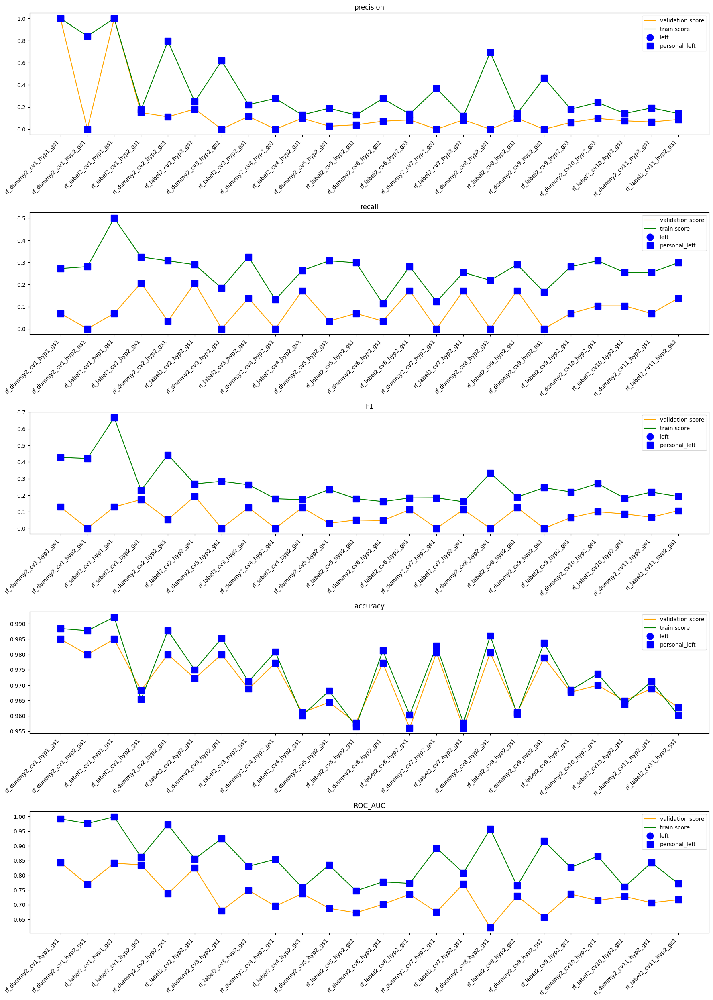

In [58]:
##############################################
#Show Validation Results
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(rf_val_score['model'], rf_val_score[metric], color='orange', label='validation score')
    ax.plot(rf_train_score['model'], rf_train_score[metric], color='green', label='train score')
    
    substr_list=[
        #left
        '_dummy1_|_label1_',
        #personal_left
        '_dummy2_|_label2_',
    ]
    marker_list=['bo','bs']
    markersize_list=[12,12]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(rf_val_score[rf_val_score['model'].str.contains(substr)]['model'], rf_val_score[rf_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(rf_train_score[rf_train_score['model'].str.contains(substr)]['model'], rf_train_score[rf_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout()
plt.show()

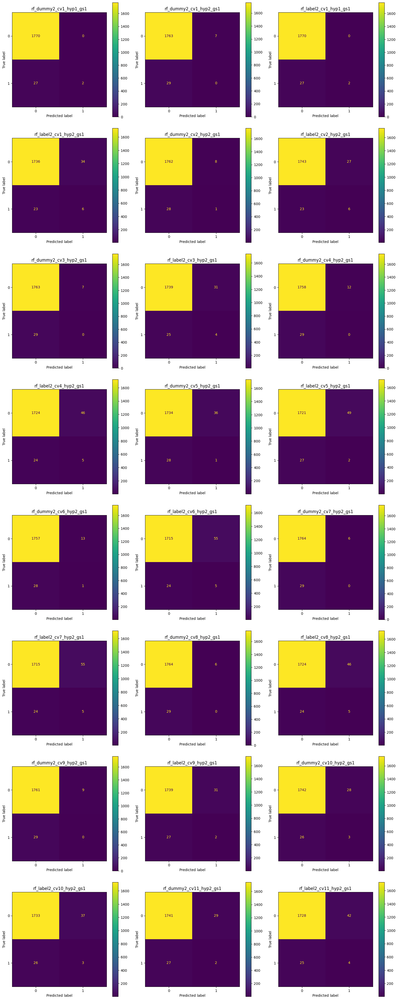

In [59]:
#################################################################################
##Display confusion on validation data
#################################################################################
rowCount=math.ceil(len(rf_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        confusion_matrix_plot_ax(rf_cv, 
                              X_dummy_val[select_feature], 
                              y_dummy_val, 
                              ax=ax, 
                              title=rf_model_name_list[index])
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        confusion_matrix_plot_ax(rf_cv, 
                              X_label_val[select_feature],
                              y_label_val, 
                              ax=ax, 
                              title=rf_model_name_list[index])

plt.tight_layout()
plt.show()

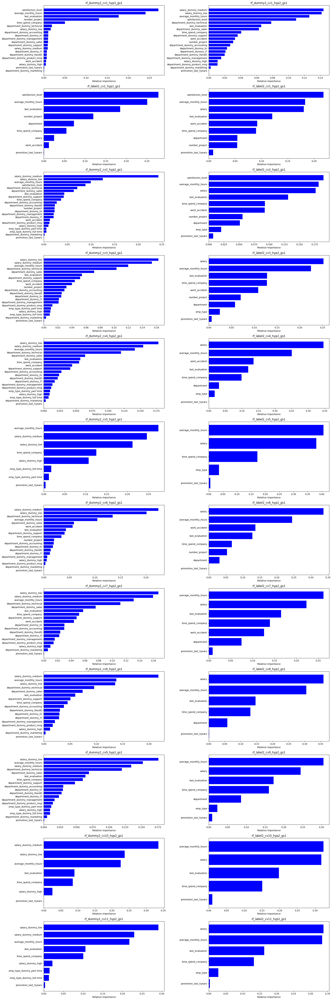

In [60]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(rf_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    if type(rf_best)==Pipeline:
        importances=rf_best.named_steps["randomforestclassifier"].feature_importances_
    else:
        importances = rf_best.feature_importances_

    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'rf_label' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)

    # customized number
    if len(importances)>=25:
        num_features = 25
    else:
        num_features =len(importances)

    ax.set_title(rf_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    ax.set_xlabel('Relative Importance')
    #ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_yticks(range(num_features))
    ax.set_yticklabels([features[i] for i in indices[-num_features:]])

plt.tight_layout()
plt.show()

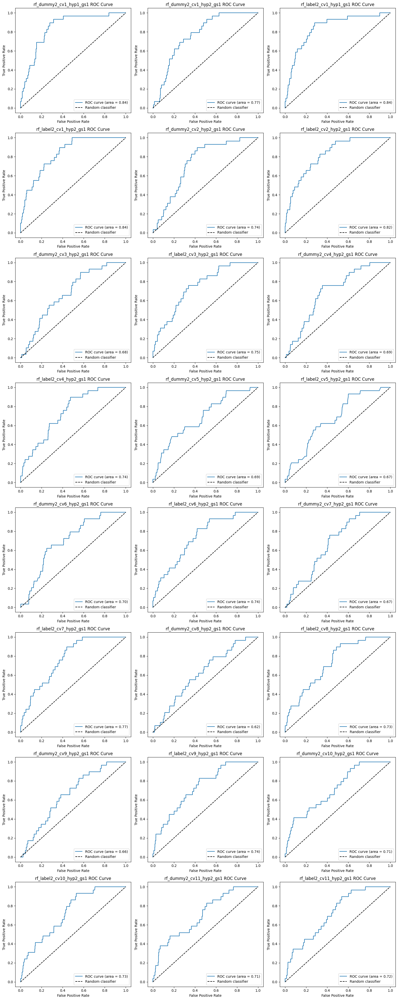

In [61]:
#############################################################
#Plot AUC curve
#############################################################
rowCount=math.ceil(len(rf_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        # plot ROC curve
        rf_preds_proba=rf_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_dummy_val, rf_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_dummy_val, rf_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{rf_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        # plot ROC curve
        rf_preds_proba=rf_best.predict_proba(X_label_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_label_val, rf_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_label_val, rf_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{rf_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")

plt.tight_layout()
plt.show()

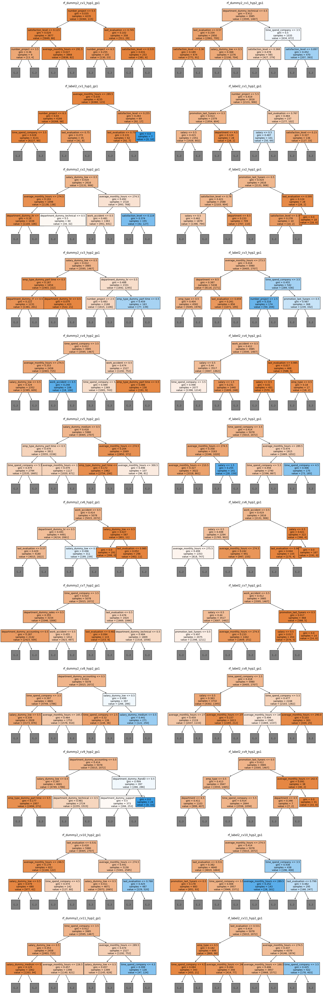

In [62]:
#############################################################
#Plot tree
#############################################################
from sklearn import tree

rowCount=math.ceil(len(rf_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for rf_cv, ax, index in zip(rf_cv_list, axes.flatten(), range(len(rf_cv_list))):
    rf_best=rf_cv.best_estimator_
    if type(rf_best)==Pipeline:
        rf_best=rf_best.named_steps["randomforestclassifier"]
    importances = rf_best.feature_importances_
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'rf_label' in rf_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')
    
    tree.plot_tree(rf_best.estimators_[0],
                   feature_names = features, 
                   #class_names=cn,
                   filled = True,
                   max_depth=2,
                   fontsize=10,
                   ax = ax)
        
    ax.set_title(rf_model_name_list[index])

plt.tight_layout()
plt.show()

### XGBoost

In [63]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################

import os
import glob
import shutil
 
source = '/kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/xgboost/xgb_pickle/'
destination = path_xgb

# gather all files
allfiles = glob.glob(os.path.join(source, 'xgb_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")

Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/xgboost/xgb_pickle/xgb_label2_cv9_hyp2_gs3.pickle -> /kaggle/working/xgb_pickle/xgb_label2_cv9_hyp2_gs3.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/xgboost/xgb_pickle/xgb_label2_cv4_hyp2_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_label2_cv4_hyp2_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/xgboost/xgb_pickle/xgb_label2_cv6_hyp2_gs3.pickle -> /kaggle/working/xgb_pickle/xgb_label2_cv6_hyp2_gs3.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/xgboost/xgb_pickle/xgb_label2_cv10_hyp2_gs4.pickle -> /kaggle/working/xgb_pickle/xgb_label2_cv10_hyp2_gs4.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/xgboost/xgb_pickle/xgb_dummy2_cv6_hyp2_gs3.pickle -> /kaggle/working/xgb_pickle/xgb_dummy2_cv6_hyp2_gs3.pickle
Copied /kaggle/input/nyc-taxi-zone/SalifortMotors/SalifortMotors/xgboost/xgb_pickle/xgb_dummy1_cv2_hyp1_gs1.pickle -> 

In [64]:
#https://xgboost.readthedocs.io/en/latest/parameter.html
#scale_pos_weight: Control the balance of positive and negative weights, 
#useful for unbalanced classes. 
#A typical value to consider: sum(negative instances) / sum(positive instances)
total_count=df_sample.shape[0]
for dep_var in depedent_variables:
    positive_cnt=df_sample[dep_var].sum()
    negative_cnt=total_count-positive_cnt
    negative_positive_ratio=round(negative_cnt/positive_cnt,1)
    print(dep_var,negative_positive_ratio)

left 5.0
personal_left 61.8


In [65]:
select_index=2
select_col=select_col_list[select_index-1]
dummy_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
label_feature=get_fit_features(select_col,X_label_train.columns,'label')

print(label_feature)
result={
    'sqrt dummy': np.sqrt(len(X_dummy_train[dummy_feature].columns)),
    'log dummy': np.log(len(X_dummy_train[dummy_feature].columns)),
    '0.2 dummy': len(X_dummy_train[dummy_feature].columns)*0.2,
    '0.3 dummy': len(X_dummy_train[dummy_feature].columns)*0.3,
    '0.4 dummy': len(X_dummy_train[dummy_feature].columns)*0.4,
    '0.5 dummy': len(X_dummy_train[dummy_feature].columns)*0.5,
    '0.7 dummy': len(X_dummy_train[dummy_feature].columns)*0.7,
    '0.9 dummy': len(X_dummy_train[dummy_feature].columns)*0.9,
    '1 dummy': len(X_dummy_train[dummy_feature].columns)*1,
    'sqrt label': np.sqrt(len(X_label_train[label_feature].columns)),
    'log label': np.log(len(X_label_train[label_feature].columns)),
    '0.3 label': (len(X_label_train[label_feature].columns))*0.3,
    '0.5 label': (len(X_label_train[label_feature].columns))*0.5,
    '0.7 label': (len(X_label_train[label_feature].columns))*0.7,
    '0.9 label': (len(X_label_train[label_feature].columns))*0.9,
    '1 label': (len(X_label_train[label_feature].columns))*1,
}
pd.DataFrame(data=[result])

['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary', 'emp_type']


,sqrt dummy,log dummy,0.2 dummy,0.3 dummy,0.4 dummy,0.5 dummy,0.7 dummy,0.9 dummy,1 dummy,sqrt label,log label,0.3 label,0.5 label,0.7 label,0.9 label,1 label
0,4.690416,3.091042,4.4,6.6,8.8,11.0,15.4,19.8,22,3.162278,2.302585,3.0,5.0,7.0,9.0,10


In [66]:
xgb = XGBClassifier(objective='binary:logistic', random_state=RANDOM_STATE)


#https://xgboost.readthedocs.io/en/latest/parameter.html#parameters-for-tree-booster
xgb_cv_dummy_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_child_weight': [1],
     'learning_rate': [0.1, 0.2, 0.3],
     'n_estimators': [80, 120, 160],
     'subsample':[0.3, 0.5, 0.7, 0.9],
     'colsample_bytree':[0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'scale_pos_weight':[1,62],
    },
    #index:2 (for oversample)
    {'max_depth': [5,7,9,11], 
     'min_child_weight': [1],
     'learning_rate': [0.1, 0.2, 0.3],
     'n_estimators': [80, 120, 160],
     'subsample':[0.3, 0.5, 0.7, 0.9],
     'colsample_bytree':[0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
    },
]

xgb_cv_label_params_list=[
    #index:1
    {'max_depth': [5,7,9,11], 
     'min_child_weight': [1],
     'learning_rate': [0.1, 0.2, 0.3],
     'n_estimators': [80, 120, 160],
     'subsample':[0.3, 0.5, 0.7, 0.9],
     'colsample_bytree':[0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
     'scale_pos_weight':[1,62],
    },
    #index:2 (for oversample)
    {'max_depth': [5,7,9,11], 
     'min_child_weight': [1],
     'learning_rate': [0.1, 0.2, 0.3],
     'n_estimators': [80, 120, 160],
     'subsample':[0.3, 0.5, 0.7, 0.9],
     'colsample_bytree':[0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1],
    },
]

#### Fit model

In [67]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use original dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

#2025-03-19 11:50:51.564041: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 62]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  xgb_dummy2_cv1_hyp1_gs1
#**************Fit parameters******************
#2025-03-19 12:07:46.958272: Fit End
#Fit duration: 16 min 55 s

Couldn't find program: 'True'


In [68]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use original dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='recall')
            xgb_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', xgb_classifier=xgb,cv=5, refit='recall')


Couldn't find program: 'True'


In [69]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]


for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)

#2025-03-19 13:35:55.729117: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department_dummy_IT', 'department_dummy_RandD', 'department_dummy_accounting', 'department_dummy_hr', 'department_dummy_management', 'department_dummy_marketing', 'department_dummy_product_mng', 'department_dummy_sales', 'department_dummy_support', 'department_dummy_technical', 'salary_dummy_low', 'salary_dummy_medium', 'salary_dummy_high']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 62]}
#encoding_type:  dummy
#cv:  5
#refit:  f1
#pickle file name:  xgb_dummy2_cv1_hyp1_gs3
#**************Fit parameters******************
#2025-03-19 14:00:25.382360: Fit End
#Fit duration: 24 min 29 s

#2025-03-19 14:00:25.387186: Fit Start
#**************Fit parameters******************
#select_col:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#select_feature:  ['satisfaction_level', 'last_evaluation', 'number_project', 'average_monthly_hours', 'time_spend_company', 'work_accident', 'promotion_last_5years', 'department', 'salary']
#hyp_params:  {'max_depth': [5, 7, 9, 11], 'min_child_weight': [1], 'learning_rate': [0.1, 0.2, 0.3], 'n_estimators': [80, 120, 160], 'subsample': [0.3, 0.5, 0.7, 0.9], 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'scale_pos_weight': [1, 62]}
#encoding_type:  label
#cv:  5
#refit:  f1
#pickle file name:  xgb_label2_cv1_hyp1_gs3
#**************Fit parameters******************
#2025-03-19 14:16:55.424664: Fit End
#Fit duration: 16 min 30 s

Couldn't find program: 'True'


In [70]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
#use oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='label', xgb_classifier=xgb,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)

Couldn't find program: 'True'


In [71]:
%%script True
####################################################
#target_index:[2]
#feature_index:[2,3,4,5,6,7,8,9]
#hyparameter index: [2]
#GridSearchCV index: [3,4]
#encoding:dummy & label
#cv:5
#use original and oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[2,3,4,5,6,7,8,9]
#hyparameter index,start from 1
hyp_index_list=[2]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='label', xgb_classifier=xgb,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            

Couldn't find program: 'True'


In [72]:
%%script True
####################################################
#target_index:[2]
#feature_index:[2,3,4,5,6,7,8,9]
#hyparameter index: [2]
#GridSearchCV index: [1,2]
#encoding:dummy & label
#cv:5
#use oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[2,3,4,5,6,7,8,9]
#hyparameter index,start from 1
hyp_index_list=[2]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
            xgb_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='recall')
            xgb_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', xgb_classifier=xgb,cv=5, refit='recall')

Couldn't find program: 'True'


In [73]:
%%script True
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [2]
#GridSearchCV index: [3,4]
#encoding:dummy & label
#cv:5
#use original and oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[1]
#hyparameter index,start from 1
hyp_index_list=[2]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='label', xgb_classifier=xgb,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)

Couldn't find program: 'True'


In [74]:
%%script True
####################################################
#target_index:[2]
#feature_index:[10,11]
#hyparameter index: [2]
#GridSearchCV index: [3,4]
#encoding:dummy & label
#cv:5
#use original and oversampling dataset
####################################################
target_index_list=[2]
feature_index_list=[10,11]
#hyparameter index,start from 1
hyp_index_list=[2]

for target_index in target_index_list:
    for feature_index in feature_index_list:
        for hyp_index in hyp_index_list:
            xgb_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 3, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)
            xgb_grid_fit(target_index,feature_index, hyp_index, 4, encoding_type='label', xgb_classifier=xgb,cv=5, refit='recall',ifresample=True,sampling_strategy=0.43)

Couldn't find program: 'True'


In [75]:
###################################################
#Read from pickle
###################################################

#target_len=len(depedent_variables)
target_len=[2]
feature_len=len(select_col_list)
hyp_len=max(len(xgb_cv_label_params_list),len(xgb_cv_dummy_params_list))
gs_len=[3]
encoding_type=['dummy','label']
xgb_cv_list,xgb_model_name_list=xgb_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_xgb)

In [76]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
xgb_best_hyperparameters=pd.DataFrame()
for index in range(len(xgb_cv_list)):
    xgb_row_org=xgb_cv_list[index].best_params_
    #remove xgbclassifier__ in resampled model
    xgb_row = {k.replace('xgbclassifier__',''):v for k,v in xgb_row_org.items()}
    xgb_row['xgb Model name']=xgb_model_name_list[index]
    df_dictionary = pd.DataFrame([xgb_row])
    xgb_best_hyperparameters = pd.concat([xgb_best_hyperparameters, df_dictionary], ignore_index=True)

xgb_best_hyperparameters.to_csv('xgb_best_hyperparameters.csv', index=False)
xgb_best_hyperparameters

,colsample_bytree,learning_rate,max_depth,min_child_weight,n_estimators,subsample,xgb Model name
0,1.0,0.2,5,1,120,0.9,xgb_dummy2_cv1_hyp2_gs3
1,0.9,0.1,9,1,120,0.3,xgb_label2_cv1_hyp2_gs3
2,0.7,0.3,5,1,160,0.7,xgb_dummy2_cv2_hyp2_gs3
3,0.6,0.3,5,1,120,0.7,xgb_label2_cv2_hyp2_gs3
4,1.0,0.2,5,1,120,0.7,xgb_dummy2_cv3_hyp2_gs3
5,0.8,0.2,9,1,120,0.3,xgb_label2_cv3_hyp2_gs3
6,0.8,0.3,5,1,80,0.3,xgb_dummy2_cv4_hyp2_gs3
7,0.8,0.1,5,1,160,0.5,xgb_label2_cv4_hyp2_gs3
8,0.4,0.2,5,1,80,0.9,xgb_dummy2_cv5_hyp2_gs3
9,0.4,0.1,5,1,80,0.5,xgb_label2_cv5_hyp2_gs3


In [77]:
###################################################
#Training Results
###################################################
xgb_train_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        xgb_preds=xgb_best.predict(X_dummy_train[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_dummy_train[select_feature])[:, 1]
        train_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_dummy_train,xgb_preds_proba)
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        xgb_preds=xgb_best.predict(X_label_train[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_label_train[select_feature])[:, 1]
        train_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_label_train,xgb_preds_proba)
    
    xgb_train_score_list.append(train_score)

xgb_train_score=pd.concat(xgb_train_score_list).reset_index(drop=True)
xgb_train_score.to_csv('xgb_train_score.csv', index=False)
xgb_train_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,xgb_dummy2_cv1_hyp2_gs3,0.891892,0.578947,0.702128,0.992216,0.989803
1,xgb_label2_cv1_hyp2_gs3,0.531429,0.815789,0.643599,0.985683,0.992197
2,xgb_dummy2_cv2_hyp2_gs3,0.990196,0.885965,0.935185,0.998054,0.999665
3,xgb_label2_cv2_hyp2_gs3,0.510526,0.850877,0.638158,0.984709,0.991512
4,xgb_dummy2_cv3_hyp2_gs3,0.873016,0.482456,0.621469,0.990687,0.983755
5,xgb_label2_cv3_hyp2_gs3,0.608974,0.833333,0.703704,0.988880,0.994632
6,xgb_dummy2_cv4_hyp2_gs3,0.593750,0.333333,0.426966,0.985822,0.954916
7,xgb_label2_cv4_hyp2_gs3,0.167131,0.526316,0.253700,0.950931,0.910572
8,xgb_dummy2_cv5_hyp2_gs3,0.160714,0.315789,0.213018,0.963025,0.840322
9,xgb_label2_cv5_hyp2_gs3,0.089485,0.350877,0.142602,0.933139,0.769241


In [78]:
###################################################
#Validation Results
###################################################
xgb_val_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        xgb_preds=xgb_best.predict(X_dummy_val[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        val_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_dummy_val,xgb_preds_proba)
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        xgb_preds=xgb_best.predict(X_label_val[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_label_val[select_feature])[:, 1]
        val_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_label_val,xgb_preds_proba)
    
    xgb_val_score_list.append(val_score)

xgb_val_score=pd.concat(xgb_val_score_list).reset_index(drop=True)
xgb_val_score.to_csv('xgb_val_score.csv', index=False)
xgb_val_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,xgb_dummy2_cv1_hyp2_gs3,0.200000,0.034483,0.058824,0.982212,0.801968
1,xgb_label2_cv1_hyp2_gs3,0.204545,0.310345,0.246575,0.969427,0.822482
2,xgb_dummy2_cv2_hyp2_gs3,0.166667,0.068966,0.097561,0.979433,0.773232
3,xgb_label2_cv2_hyp2_gs3,0.222222,0.344828,0.270270,0.969983,0.837814
4,xgb_dummy2_cv3_hyp2_gs3,0.090909,0.034483,0.050000,0.978877,0.719949
5,xgb_label2_cv3_hyp2_gs3,0.095238,0.206897,0.130435,0.955531,0.754218
6,xgb_dummy2_cv4_hyp2_gs3,0.100000,0.034483,0.051282,0.979433,0.650555
7,xgb_label2_cv4_hyp2_gs3,0.086957,0.275862,0.132231,0.941634,0.763725
8,xgb_dummy2_cv5_hyp2_gs3,0.022727,0.034483,0.027397,0.960534,0.696367
9,xgb_label2_cv5_hyp2_gs3,0.060606,0.206897,0.093750,0.935520,0.697954


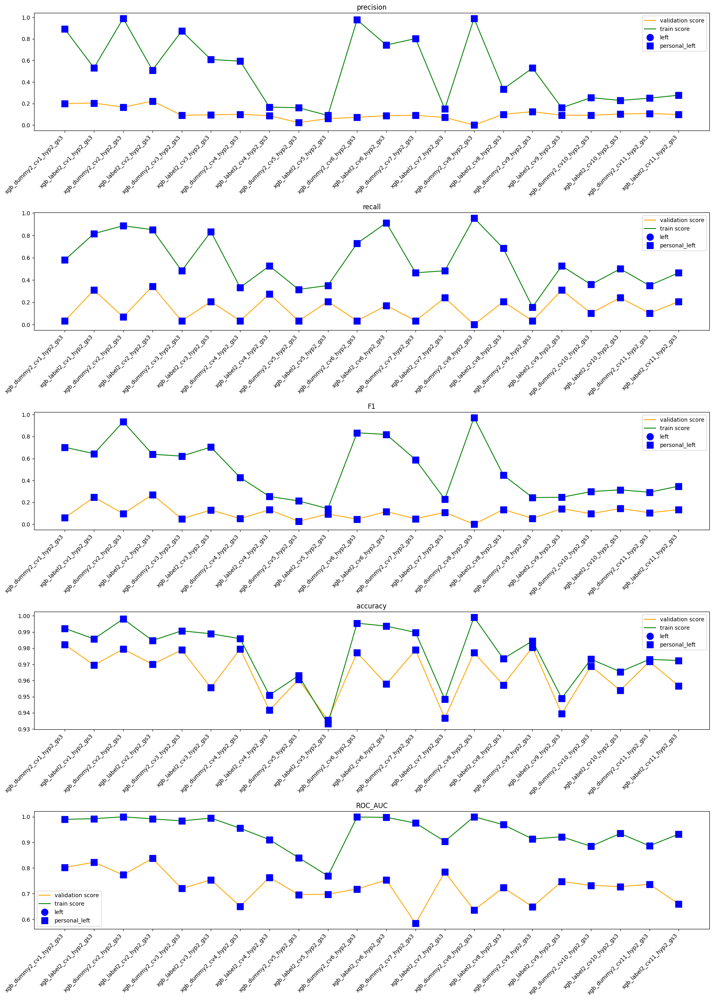

In [79]:
##############################################
#Show Validation Results
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(xgb_val_score['model'], xgb_val_score[metric], color='orange', label='validation score')
    ax.plot(xgb_train_score['model'], xgb_train_score[metric], color='green', label='train score')
    
    substr_list=[
        #left
        '_dummy1_|_label1_',
        #personal_left
        '_dummy2_|_label2_',
    ]
    marker_list=['bo','bs']
    markersize_list=[12,12]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(xgb_val_score[xgb_val_score['model'].str.contains(substr)]['model'], xgb_val_score[xgb_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(xgb_train_score[xgb_train_score['model'].str.contains(substr)]['model'], xgb_train_score[xgb_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout()
plt.show()

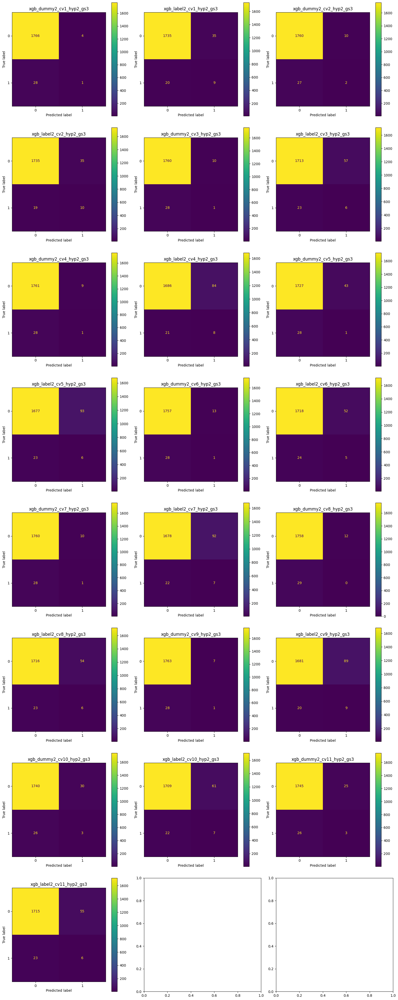

In [80]:
#################################################################################
##Display confusion on validation data
#################################################################################
rowCount=math.ceil(len(xgb_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        confusion_matrix_plot_ax(xgb_cv, 
                              X_dummy_val[select_feature], 
                              y_dummy_val, 
                              ax=ax, 
                              title=xgb_model_name_list[index])
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        confusion_matrix_plot_ax(xgb_cv, 
                              X_label_val[select_feature],
                              y_label_val, 
                              ax=ax, 
                              title=xgb_model_name_list[index])

plt.tight_layout()
plt.show()

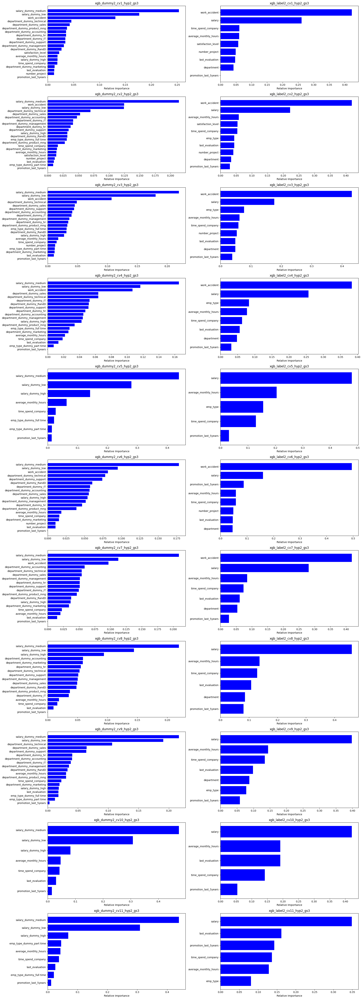

In [81]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(xgb_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    if type(xgb_best)==Pipeline:
        importances=xgb_best.named_steps["xgbclassifier"].feature_importances_
    else:
        importances = xgb_best.feature_importances_

    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'xgb_label' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)

    # customized number
    if len(importances)>=25:
        num_features = 25
    else:
        num_features =len(importances)

    ax.set_title(xgb_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    ax.set_xlabel('Relative Importance')
    #ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_yticks(range(num_features))
    ax.set_yticklabels([features[i] for i in indices[-num_features:]])

plt.tight_layout()
plt.show()

In [82]:
%%script True
#############################################################
#Plot tree
#############################################################
#from sklearn import tree
from xgboost import plot_tree

fig, ax = plt.subplots(figsize=(20,30))

for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'xgb_label' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')
    
    plot_tree(xgb_best, num_trees=0, rankdir='LR',ax=ax)
    #plt.savefig(path+'image/'+xgb_model_name_list[index]+'.png', bbox_inches='tight')
    #plt.savefig(path+'image/'+xgb_model_name_list[index]+'.eps', format='eps', bbox_inches='tight')
    #fig.savefig(path+'image/'+xgb_model_name_list[index]+'.jpg', format='jpg', bbox_inches='tight', dpi=1200)
    fig.savefig(path+'image/'+xgb_model_name_list[index]+'.svg', format='svg', bbox_inches='tight', dpi=1200)
    plt.close(fig)

Couldn't find program: 'True'


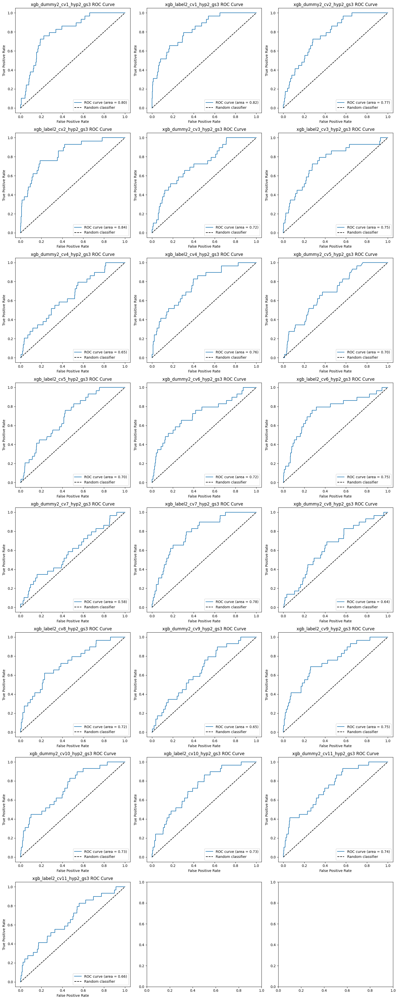

In [83]:
#############################################################
#Plot AUC curve
#############################################################
rowCount=math.ceil(len(xgb_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        # plot ROC curve
        xgb_preds_proba=xgb_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_dummy_val, xgb_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_dummy_val, xgb_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{xgb_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        # plot ROC curve
        xgb_preds_proba=xgb_best.predict_proba(X_label_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_label_val, xgb_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_label_val, xgb_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{xgb_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")

plt.tight_layout()
plt.show()

#### Compare score on all models

In [84]:
#Merge all train results
allmodel_train_score=pd.concat([rf_train_score,xgb_train_score]).reset_index(drop=True)

#Merge all validation results
allmodel_val_score=pd.concat([rf_val_score,xgb_val_score]).reset_index(drop=True)

#allmodel_val_score.to_csv('allmodel_val_score.csv', index=False)
display(allmodel_train_score.head())
display(allmodel_val_score.head())

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy2_cv1_hyp1_gs1,1.000000,0.271930,0.427586,0.988463,0.991746
1,rf_dummy2_cv1_hyp2_gs1,0.842105,0.280702,0.421053,0.987768,0.976476
2,rf_label2_cv1_hyp1_gs1,1.000000,0.500000,0.666667,0.992077,0.998823
3,rf_label2_cv1_hyp2_gs1,0.177033,0.324561,0.229102,0.965388,0.862515
4,rf_dummy2_cv2_hyp2_gs1,0.795455,0.307018,0.443038,0.987768,0.973207


,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy2_cv1_hyp1_gs1,1.000000,0.068966,0.129032,0.984992,0.843250
1,rf_dummy2_cv1_hyp2_gs1,0.000000,0.000000,0.000000,0.979989,0.769297
2,rf_label2_cv1_hyp1_gs1,1.000000,0.068966,0.129032,0.984992,0.841184
3,rf_label2_cv1_hyp2_gs1,0.150000,0.206897,0.173913,0.968316,0.835574
4,rf_dummy2_cv2_hyp2_gs1,0.111111,0.034483,0.052632,0.979989,0.738184


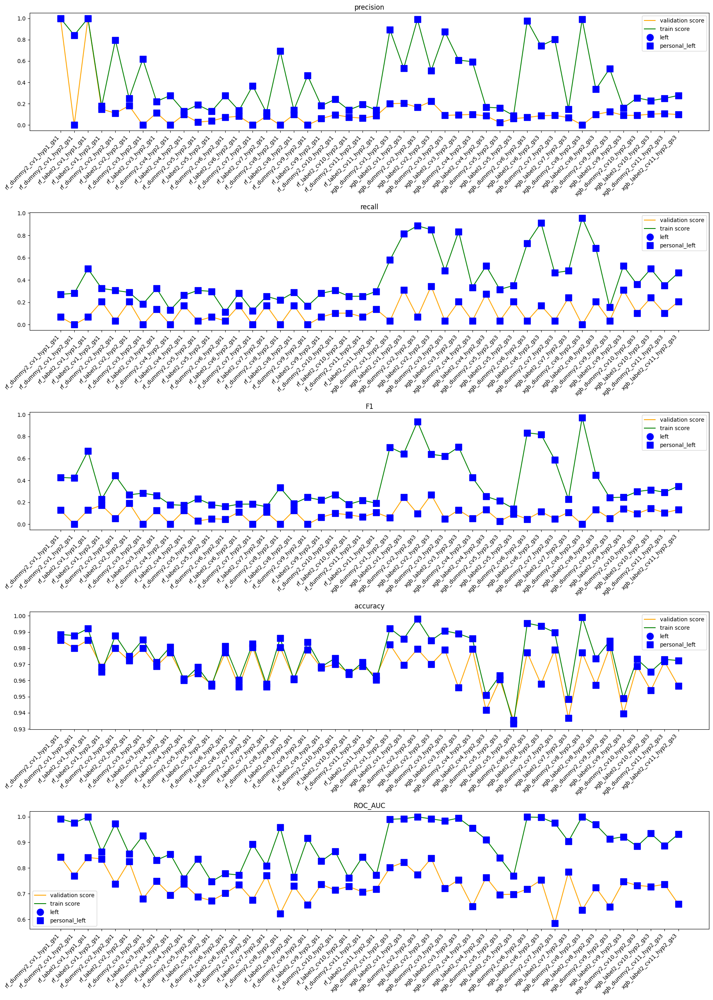

In [85]:
##############################################
#Show Validation Results
##############################################
fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(allmodel_val_score['model'], allmodel_val_score[metric], color='orange', label='validation score')
    ax.plot(allmodel_train_score['model'], allmodel_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #left
        '_dummy1_|_label1_',
        #personal_left
        '_dummy2_|_label2_',
    ]
    marker_list=['bo','bs']
    markersize_list=[12,12]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(allmodel_val_score[allmodel_val_score['model'].str.contains(substr)]['model'], allmodel_val_score[allmodel_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(allmodel_train_score[allmodel_train_score['model'].str.contains(substr)]['model'], allmodel_train_score[allmodel_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    #ax.tick_params(labelrotation=90)
    ax.legend()

plt.tight_layout()
plt.show()

### Fit model with train and validation set

* Select a champion model: `xgb_label2_cv10_hyp2_gs3`
* Fit champion model with train and validation set
* Evaluate champion model on test set

In [86]:
%%script True
#########################################################
#Best model(Please ignore this)
#########################################################
#get best params
best_model_index=rf_model_name_list.index('rf_dummy2_cv10_hyp2_gs1')
best_rf=rf_cv_list[best_model_index]
best_params=best_rf.best_params_
#remove randomforestclassifier__ in resampled model
best_params = {k.replace('randomforestclassifier__',''):v for k,v in best_params.items()}

best_model_name=rf_model_name_list[best_model_index]
#pickle file rf_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'RF Model name' in best_params:
        best_params.pop('RF Model name')
rf_classifier_best = RandomForestClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'rf_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'rf_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    X_dummy_train_val_over,y_dummy_train_val_over=resample_data(X_dummy_train_val, y_dummy_train_val,
             sampling_strategy=0.43,
               random_state=7,)
    rf_classifier_best.fit(X_dummy_train_val_over[select_feature], y_dummy_train_val_over)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_dummy_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_dummy_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_dummy_test,rf_preds_proba)
        
elif 'rf_label' in best_model_name:
    target_index=find_number(best_model_name, 'rf_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    # Fiting the model to the training data using the best parameters
    X_label_train_val_over,y_dummy_label_val_over=resample_data(X_label_train_val, y_label_train_val,
             sampling_strategy=0.43,
               random_state=7,)
    rf_classifier_best.fit(X_label_train_val_over[select_feature], y_dummy_label_val_over)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    rf_preds=rf_classifier_best.predict(X_label_test[select_feature])
    rf_preds_proba=rf_classifier_best.predict_proba(X_label_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, rf_preds, y_label_test,rf_preds_proba)

rf_test_score=pd.concat([test_score]).reset_index(drop=True)
rf_test_score.to_csv('rf_test_score.csv', index=False, mode='w')
rf_test_score

Couldn't find program: 'True'


In [87]:
###################################################
#Just see all models
###################################################
rf_all_test_score_list=[]
for rf_cv, index in zip(rf_cv_list, range(len(rf_cv_list))):
    rf_params=rf_cv.best_params_
    #remove randomforestclassifier__ in resampled model
    rf_params = {k.replace('randomforestclassifier__',''):v for k,v in rf_params.items()}
    if 'RF Model name' in rf_params:
        rf_params.pop('RF Model name')
    rf_classifier = RandomForestClassifier(**rf_params,
                                          random_state=RANDOM_STATE)
    #pickle file rf_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(rf_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'rf_dummy' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_dummy')[0]-1
        X_dummy_train_val=X_dummy_train_val_list[target_index]
        y_dummy_train_val=y_dummy_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
        # Fiting the model to the training data using the best parameters
        X_dummy_train_val_over,y_dummy_train_val_over=resample_data(X_dummy_train_val, y_dummy_train_val,
             sampling_strategy=0.43,
               random_state=7,)
        rf_classifier.fit(X_dummy_train_val_over[select_feature], y_dummy_train_val_over)
        
        X_dummy_test=X_dummy_test_list[target_index]
        y_dummy_test=y_dummy_test_list[target_index]
        rf_preds=rf_classifier.predict(X_dummy_test[select_feature])
        rf_preds_proba=rf_classifier.predict_proba(X_dummy_test[select_feature])[:, 1]
        test_score=get_test_scores(rf_model_name_list[index], rf_preds, y_dummy_test,rf_preds_proba)
        
    elif 'rf_label' in rf_model_name_list[index]:
        target_index=find_number(rf_model_name_list[index], 'rf_label')[0]-1
        X_label_train_val=X_label_train_val_list[target_index]
        y_label_train_val=y_label_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
        # Fiting the model to the training data using the best parameters
        X_label_train_val_over,y_label_train_val_over=resample_data(X_label_train_val, y_label_train_val,
             sampling_strategy=0.43,
               random_state=7,)
        rf_classifier.fit(X_label_train_val_over[select_feature], y_label_train_val_over)
        
        X_label_test=X_label_test_list[target_index]
        y_label_test=y_label_test_list[target_index]
        rf_preds=rf_classifier.predict(X_label_test[select_feature])
        rf_preds_proba=rf_classifier.predict_proba(X_label_test[select_feature])[:, 1]
        test_score=get_test_scores(rf_model_name_list[index], rf_preds, y_label_test,rf_preds_proba)
    
    rf_all_test_score_list.append(test_score)

rf_all_test_score=pd.concat(rf_all_test_score_list).reset_index(drop=True)
rf_all_test_score.to_csv('rf_all_test_score.csv', index=False)
rf_all_test_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,rf_dummy2_cv1_hyp1_gs1,0.259259,0.145833,0.186667,0.979653,0.811748
1,rf_dummy2_cv1_hyp2_gs1,0.400000,0.125000,0.190476,0.982989,0.832253
2,rf_label2_cv1_hyp1_gs1,0.088235,0.500000,0.150000,0.909273,0.834131
3,rf_label2_cv1_hyp2_gs1,0.158537,0.270833,0.200000,0.965310,0.815918
4,rf_dummy2_cv2_hyp2_gs1,0.318182,0.145833,0.200000,0.981321,0.833347
5,rf_label2_cv2_hyp2_gs1,0.151515,0.208333,0.175439,0.968646,0.810494
6,rf_dummy2_cv3_hyp2_gs1,0.555556,0.104167,0.175439,0.984323,0.759329
7,rf_label2_cv3_hyp2_gs1,0.151515,0.208333,0.175439,0.968646,0.742465
8,rf_dummy2_cv4_hyp2_gs1,0.466667,0.145833,0.222222,0.983656,0.729933
9,rf_label2_cv4_hyp2_gs1,0.078571,0.229167,0.117021,0.944630,0.739004


In [88]:
#########################################################
#Champion model
#########################################################
#get best params
best_model_index=xgb_model_name_list.index('xgb_label2_cv10_hyp2_gs3')
best_xgb=xgb_cv_list[best_model_index]
best_params=best_xgb.best_params_
#remove xgbclassifier__ in resampled model
best_params = {k.replace('xgbclassifier__',''):v for k,v in best_params.items()}
best_model_name=xgb_model_name_list[best_model_index]
#pickle file xgb_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'xgb Model name' in best_params:
        best_params.pop('xgb Model name')
xgb_classifier_best = XGBClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'xgb_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    X_dummy_train_val_over,y_dummy_train_val_over=resample_data(X_dummy_train_val, y_dummy_train_val,
             sampling_strategy=0.43,
               random_state=7,)
    xgb_classifier_best.fit(X_dummy_train_val_over[select_feature], y_dummy_train_val_over)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    xgb_preds=xgb_classifier_best.predict(X_dummy_test[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_dummy_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, xgb_preds, y_dummy_test,xgb_preds_proba)
        
elif 'xgb_label' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    # Fiting the model to the training data using the best parameters
    X_label_train_val_over,y_label_train_val_over=resample_data(X_label_train_val, y_label_train_val,
             sampling_strategy=0.43,
               random_state=7,)
    xgb_classifier_best.fit(X_label_train_val_over[select_feature], y_label_train_val_over)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    xgb_preds=xgb_classifier_best.predict(X_label_test[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_label_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, xgb_preds, y_label_test,xgb_preds_proba)

xgb_test_score=pd.concat([test_score]).reset_index(drop=True)
xgb_test_score.to_csv('xgb_test_score.csv', index=False, mode='w')
xgb_test_score

best hyperpatameters: {'colsample_bytree': 0.6, 'learning_rate': 0.3, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 120, 'subsample': 0.7}
best features: ['last_evaluation', 'average_monthly_hours', 'time_spend_company', 'promotion_last_5years', 'salary']
best model name: xgb_label2_cv10_hyp2_gs3


,model,precision,recall,F1,accuracy,ROC_AUC
0,xgb_label2_cv10_hyp2_gs3,0.09322,0.229167,0.13253,0.951968,0.657758


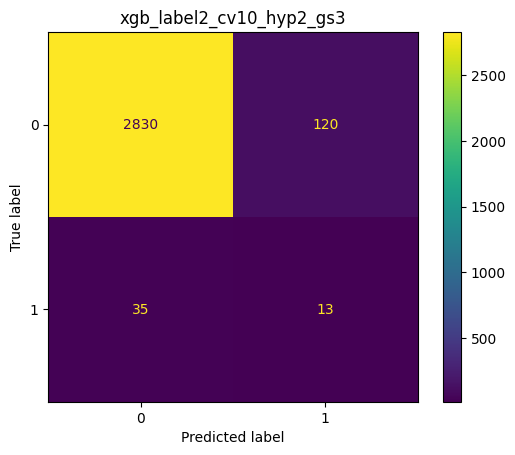

In [89]:
################################################
#Display confusion matrix of champion model
################################################
confusion_matrix_plot(best_xgb, 
                      X_label_test[select_feature], 
                      y_label_test, 
                      title=best_model_name)

In [90]:
###################################################
#Just see all models
###################################################
xgb_all_test_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_params=xgb_cv.best_params_
    #remove xgbclassifier__ in resampled model
    xgb_params = {k.replace('xgbclassifier__',''):v for k,v in xgb_params.items()}
    if 'xgb Model name' in xgb_params:
        xgb_params.pop('xgb Model name')
    xgb_classifier = XGBClassifier(**xgb_params,
                                          random_state=RANDOM_STATE)
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_train_val=X_dummy_train_val_list[target_index]
        y_dummy_train_val=y_dummy_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
        # Fiting the model to the training data using the best parameters
        X_dummy_train_val_over,y_dummy_train_val_over=resample_data(X_dummy_train_val, y_dummy_train_val,
             sampling_strategy=0.43,
               random_state=7,)
        xgb_classifier.fit(X_dummy_train_val_over[select_feature], y_dummy_train_val_over)
        
        X_dummy_test=X_dummy_test_list[target_index]
        y_dummy_test=y_dummy_test_list[target_index]
        xgb_preds=xgb_classifier.predict(X_dummy_test[select_feature])
        xgb_preds_proba=xgb_classifier.predict_proba(X_dummy_test[select_feature])[:, 1]
        test_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_dummy_test,xgb_preds_proba)
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_train_val=X_label_train_val_list[target_index]
        y_label_train_val=y_label_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
        # Fiting the model to the training data using the best parameters
        X_label_train_val_over,y_label_train_val_over=resample_data(X_label_train_val, y_label_train_val,
             sampling_strategy=0.43,
               random_state=7,)
        xgb_classifier.fit(X_label_train_val_over[select_feature], y_label_train_val_over)
        
        X_label_test=X_label_test_list[target_index]
        y_label_test=y_label_test_list[target_index]
        xgb_preds=xgb_classifier.predict(X_label_test[select_feature])
        xgb_preds_proba=xgb_classifier.predict_proba(X_label_test[select_feature])[:, 1]
        test_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_label_test,xgb_preds_proba)
    
    xgb_all_test_score_list.append(test_score)

xgb_all_test_score=pd.concat(xgb_all_test_score_list).reset_index(drop=True)
xgb_all_test_score.to_csv('xgb_all_test_score.csv', index=False)
xgb_all_test_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,xgb_dummy2_cv1_hyp2_gs3,0.578947,0.229167,0.328358,0.984990,0.823792
1,xgb_label2_cv1_hyp2_gs3,0.158416,0.333333,0.214765,0.960974,0.828919
2,xgb_dummy2_cv2_hyp2_gs3,0.500000,0.250000,0.333333,0.983989,0.826081
3,xgb_label2_cv2_hyp2_gs3,0.135922,0.291667,0.185430,0.958973,0.804583
4,xgb_dummy2_cv3_hyp2_gs3,0.428571,0.125000,0.193548,0.983322,0.734647
5,xgb_label2_cv3_hyp2_gs3,0.152941,0.270833,0.195489,0.964310,0.715727
6,xgb_dummy2_cv4_hyp2_gs3,0.214286,0.062500,0.096774,0.981321,0.689612
7,xgb_label2_cv4_hyp2_gs3,0.076923,0.270833,0.119816,0.936291,0.715572
8,xgb_dummy2_cv5_hyp2_gs3,0.160000,0.250000,0.195122,0.966978,0.742913
9,xgb_label2_cv5_hyp2_gs3,0.079787,0.312500,0.127119,0.931288,0.702306


## Results

Please refer `salifort-motors-employee-leave-prediction-eda.ipynb` for Conclusion and Recommendations

* When predict employees who will quit (Assume employees who didn't belong to the three groups were employees who choose to quit their job), time_spend_company, average_monthly_hours, salary and last_evaluation were very important factors
    * Champion model is `xgb_label2_cv10_hyp2_gs3`, use `last_evaluation`, `average_monthly_hours`, `time_spend_company`, `promotion_last_5years`, `salary`
    * On test dataset, amoung employees who are predicted to leave, 9.3% of them are actually left, amoung employees who are actually left, 22.9% of them are predicted to leave. The performance of this model is not good, not recommend to use.
    * Champion model score

|Score	|precision	|recall	    |F1	        |accuracy	|ROC_AUC |
|:-     |:-         |:-         |:-         |:-         |:-      |
|Train  |0.228916	|0.500000	|0.314050	|0.965388	|0.934529|
|Val    |0.102941	|0.241379	|0.144330	|0.953863	|0.727508|
|Test	|0.09322	|0.229167	|0.13253	|0.951968	|0.657758|

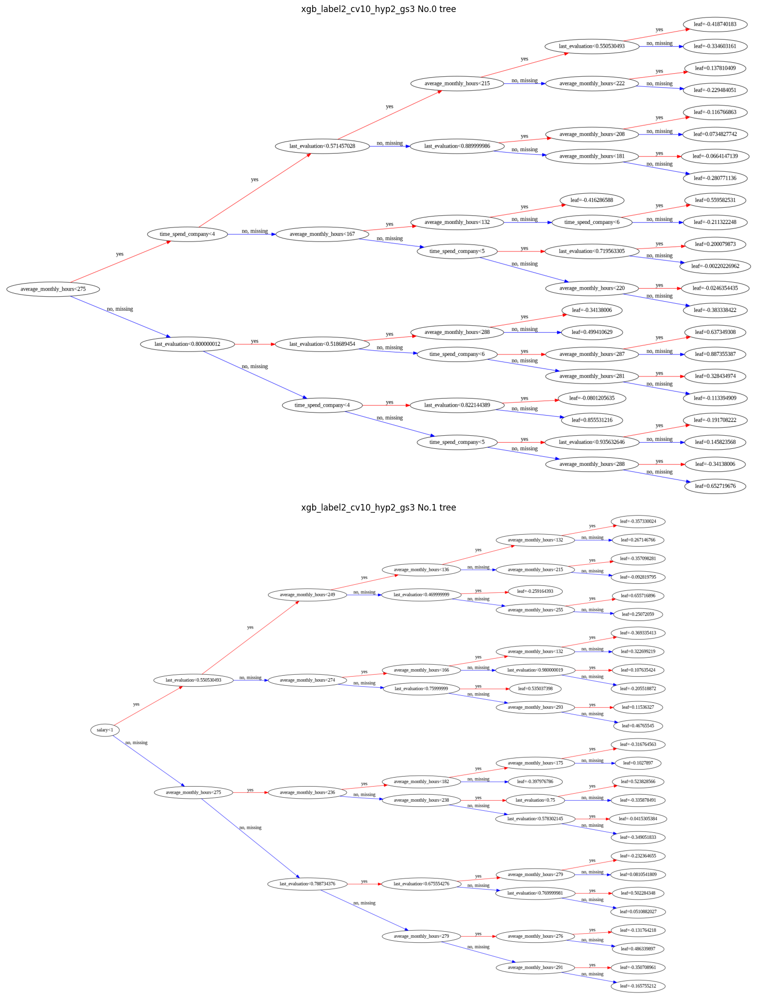

In [91]:
#############################################################
#Plot tree of champion model
#############################################################
from sklearn import tree

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20,20))

champion_model_name='xgb_label2_cv10_hyp2_gs3'
best_model_index=xgb_model_name_list.index(champion_model_name)
model_best=xgb_cv_list[best_model_index].best_estimator_
if type(model_best)==Pipeline:
    importances=model_best.named_steps["xgbclassifier"].feature_importances_
else:
    importances = model_best.feature_importances_


params_index=find_number(champion_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()

if '_dummy' in champion_model_name:
    features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
elif '_label' in champion_model_name:
     features=get_fit_features(select_col,X_label_val.columns,'label')

#plot the first tree
plot_tree(model_best.named_steps["xgbclassifier"], num_trees=0, rankdir='LR',ax=axes[0])
axes[0].set_title(f'{champion_model_name} No.0 tree')

#plot the second tree
plot_tree(model_best.named_steps["xgbclassifier"], num_trees=1, rankdir='LR',ax=axes[1])
        
axes[1].set_title(f'{champion_model_name} No.1 tree')

plt.tight_layout()
plt.show()